# ToolWear-Prediction | Diagnose & Predictive Maintenance

# Table of contents
1. **[Business Understanding](#1-business-understanding)**
2. **[Data Understanding](#2-data-understanding)**
3. **[Data Preparation](#3-data-preparation)**
    1. [Data cleaning](#31-data-cleaning)
    2. [Data normalization](#32-data-normalization)
    3. [Data transformation](#33-data-transformation)
    4. [Missing value treatment](#34-missing-value-treatment)
    5. [Imbalanced data treatment](#35-imbalanced-data-treatment)
    6. [Feature engineering](#36-feature-engineering)
4. **[Modeling](#4-modeling)**
    1. [Training eines neuronalen Netzes zur Anomalieerkennung](#41-training-eines-neuronalen-netzes-zur-anomalieerkennung)
    2. [Training eines Entscheidungsbaumes zur Anomalieerkennung](#42-training-eines-entscheidungsbaumes-zur-anomalieerkennung)
    3. [Predicitve Maintenance](#43-predictive-maintenance)
5. **[Evaluation](#5-evaluation)**

This project dives into the "Machine Predictive Maintenance Classification" dataset, using the CRISP-DM framework to guide the process.

Here’s the basic breakdown:

Understanding the Problem: Explored the dataset’s origins and defined clear objectives to guide the analysis.
Understanding the Data: Analyzed metadata and created visualizations to gain a deeper understanding of the dataset.
Preprocessing the Data: Focused on cleaning, normalizing, and preparing the data for effective analysis.
Modeling: Built and trained machine learning models to detect patterns and predict outcomes.
Evaluation: Evaluated the models against the predefined objectives to assess performance.

Here’s a quick visual of the CRISP-DM process:
<br>
![CRISP-DM](CRISP_DM.png)

# 1. Business Understanding 



The dataset comes from [Kaggle](https://www.kaggle.com/datasets/shivamb/machine-predictive-maintenance-classification) and was created by Shivam Bansa. It’s a synthetic dataset designed to mimic real-world industrial predictive maintenance data. Since the data is provided in CSV format, it’s straightforward to work with, and the small dataset size means there’s no need for prior selection or sampling.  

The measurements simulate a production system where parts are manufactured using a central tool. Once a part is completed, it’s removed, and the next part is set up. The tool experiences wear during production, which can lead to a "Tool wear" failure. After such a failure, the tool is replaced, and production continues. Alongside tool wear failures, other issues like power or overload failures are also included in the dataset.  

The main goal of this analysis is to minimize downtime in the production system. To achieve this, predictive maintenance techniques are applied. Additionally, anomalies are identified to prevent machine behavior that could lead to failures.  


# 2. Data Understanding

In [6]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sb

At the start, the CSV file is loaded using the `pandas` library, and a DataFrame is created. To get an initial overview of the data, the first and last five rows of the DataFrame are displayed.

In [7]:
#load csv file
path = r'predictive_maintenance.csv'
df= pd.read_csv(path)
df

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,No Failure
...,...,...,...,...,...,...,...,...,...,...
9995,9996,M24855,M,298.8,308.4,1604,29.5,14,0,No Failure
9996,9997,H39410,H,298.9,308.4,1632,31.8,17,0,No Failure
9997,9998,M24857,M,299.0,308.6,1645,33.4,22,0,No Failure
9998,9999,H39412,H,299.0,308.7,1408,48.5,25,0,No Failure


The DataFrame contains 10,000 records and 10 different features. Not all of these features are relevant or useful for analysis.  

- **Unique Identifier (UDI)**: This is a unique range identifier. Since the DataFrame already has an index for unique IDs, this feature can be removed.  
- **Product ID**: This consists of the product type (letters L, M, or H) and a serial number. It can also be removed since there’s a separate feature that only represents the product type, making the Product ID redundant.  
- **Air and Process Temperatures**: These are in Kelvin and were generated using a random walk algorithm.  
- **Rotational Speed**: Measured in rounds per minute (RPM).  
- **Torque**: Represented in Newton meters (Nm).  
- **Tool Wear**: Indicates how long (in minutes) the machine operates without failure. When a failure occurs, the machine is repaired, and the runtime resets for the next record.  

Finally, the dataset includes:  
- **Target**: Indicates whether a failure occurred.  
- **Failure Type**: Specifies the type of failure.  

In the next step, the **UDI** and **Product ID** features are removed, as they don’t provide significant value for the analysis.  

In [8]:
df = df.drop(["UDI","Product ID"],axis=1)

A Correlation-Heatmap is created:

C:\Users\koehl\AppData\Local\Temp\ipykernel_20036\3106554888.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sb.heatmap(df.corr(),annot=True, fmt=".2f")


<Axes: >

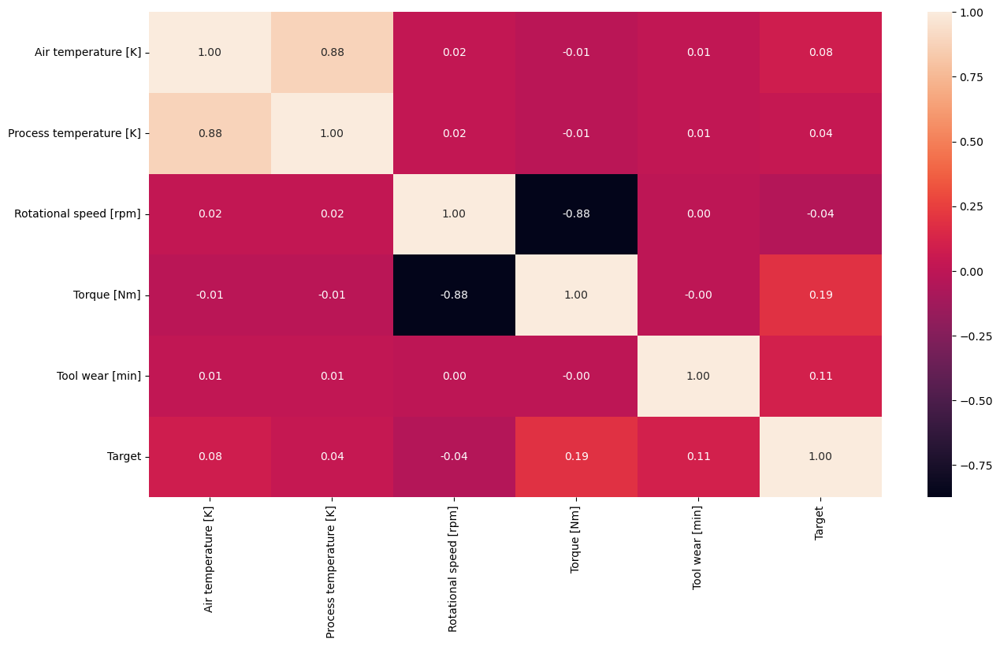

In [9]:
plt.figure(figsize = (15,8))
sb.heatmap(df.corr(),annot=True, fmt=".2f")

It’s noticeable that both air and process temperatures show a strong positive correlation of **0.88**, while rotational speed and torque exhibit a strong negative correlation of **-0.88**. Correlations between all other features are negligible (<0.2) and can be disregarded.  

Next, the counts of different product quality types and failure types are calculated and displayed.  

In [10]:
print("\n--------------------")
for col in df[['Type','Target','Failure Type']]:
    print(df[col].value_counts())
    print("--------------------")


--------------------
L    6000
M    2997
H    1003
Name: Type, dtype: int64
--------------------
0    9661
1     339
Name: Target, dtype: int64
--------------------
No Failure                  9652
Heat Dissipation Failure     112
Power Failure                 95
Overstrain Failure            78
Tool Wear Failure             45
Random Failures               18
Name: Failure Type, dtype: int64
--------------------


In the next step, this data is visualized using a count plot and a pie chart.  

Text(0.5, 1.0, 'Failure Type')

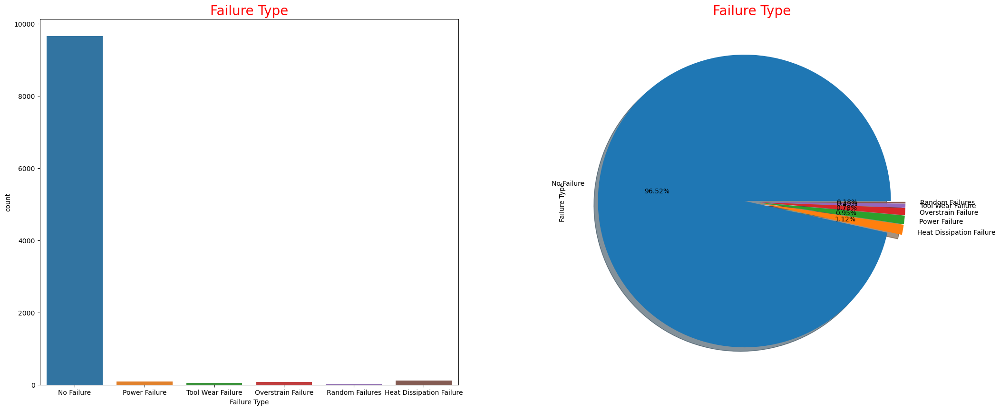

In [11]:
ax = plt.figure(figsize=(25,10))
ax = plt.subplot(1,2,1)
ax = sb.countplot(x='Failure Type', data=df)
#ax.bar_label(ax.containers[0])
plt.title("Failure Type", fontsize=20,color='Red')
ax =plt.subplot(1,2,2)
ax=df['Failure Type'].value_counts().plot.pie(explode=[0.05, 0.05,0.05,0.05,0.05,0.05],autopct='%1.2f%%',shadow=True);
ax.set_title(label = "Failure Type", fontsize = 20,color='Red')

In [12]:
df.loc[df['Failure Type'] == 'Random Failures'].value_counts()

Type  Air temperature [K]  Process temperature [K]  Rotational speed [rpm]  Torque [Nm]  Tool wear [min]  Target  Failure Type   
H     298.4                307.7                    1626                    31.1         166              0       Random Failures    1
      300.4                311.9                    1438                    46.7         41               0       Random Failures    1
M     297.0                308.3                    1399                    46.4         132              0       Random Failures    1
L     302.8                312.2                    1509                    36.5         52               0       Random Failures    1
      302.7                312.3                    1346                    61.2         170              0       Random Failures    1
      302.6                312.1                    1668                    28.7         180              0       Random Failures    1
                                                    1499    

It is evident that the data is inconsistent. According to the definition, the "Target" should be **1** if a failure occurred. However, for all "Random Failures", the "Target" is **0**, which typically indicates no failure. One option would be to remove all data points with this failure type from the dataset. However, in this analysis, it was decided to keep them to check whether these failure types can still be classified or not.

In [13]:
df.loc[df['Target'] == 1 ].loc[df['Failure Type'] =='No Failure'].value_counts()

Type  Air temperature [K]  Process temperature [K]  Rotational speed [rpm]  Torque [Nm]  Tool wear [min]  Target  Failure Type
H     298.8                309.9                    1439                    45.2         40               1       No Failure      1
L     297.2                308.1                    1431                    49.7         210              1       No Failure      1
      298.4                309.6                    1710                    27.3         163              1       No Failure      1
      300.5                309.8                    1663                    29.1         145              1       No Failure      1
      300.6                310.7                    1438                    48.5         78               1       No Failure      1
M     299.7                309.2                    1685                    28.9         179              1       No Failure      1
      301.9                310.9                    1419                    47.7 

Here, we can also see that the dataset contains inconsistencies. Some data points have the "Target" set to **1**, indicating a failure, but still have the failure type "No Failure". 

As both visualizations clearly show, there are significantly more records where no failure occurs. With less than **3.5%** of the dataset having failures, problems can arise when training a model. Therefore, data preprocessing must definitely be performed before this feature can be predicted.

Text(0.5, 1.0, 'Type')

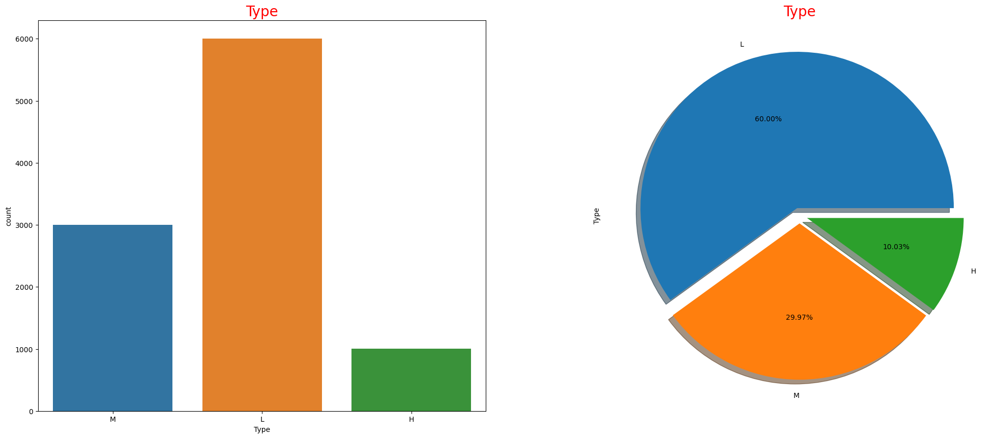

In [14]:
ax = plt.figure(figsize=(25,10))
ax = plt.subplot(1,2,1)
ax = sb.countplot(x='Type', data=df)
#ax.bar_label(ax.containers[0])
plt.title("Type", fontsize=20,color='Red')
ax =plt.subplot(1,2,2)
ax=df['Type'].value_counts().plot.pie(explode=[0.05, 0.05,0.05],autopct='%1.2f%%',shadow=True);
ax.set_title(label = "Type", fontsize = 20,color='Red')

<Axes: xlabel='Rotational speed [rpm]', ylabel='Torque [Nm]'>

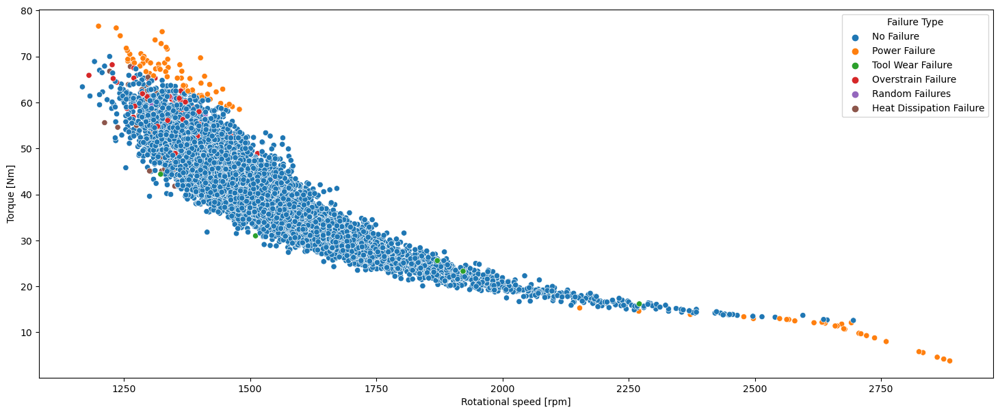

In [15]:
# bei hohem Drehmoment ist overstrain fehler häufig
plt.figure(figsize=(18,7))
sb.scatterplot(data=df, y="Torque [Nm]", x="Rotational speed [rpm]", hue="Failure Type")

<Axes: xlabel='Rotational speed [rpm]', ylabel='Torque [Nm]'>

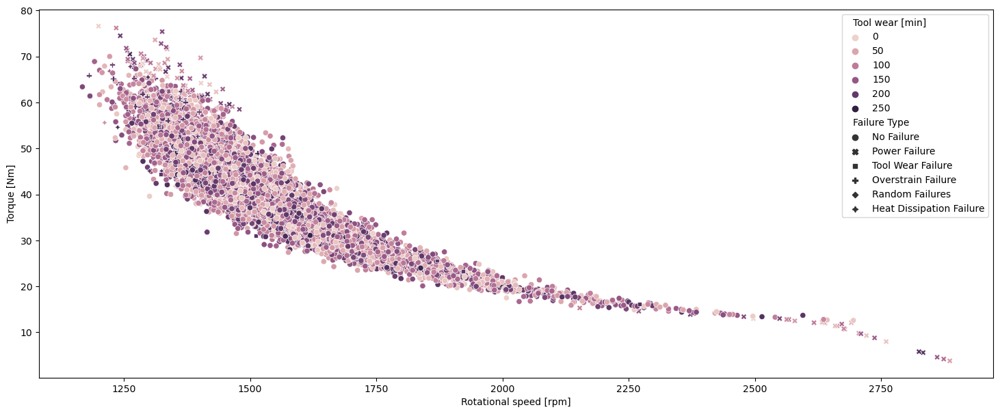

In [16]:
# bei hohem rotational speed ist power fehler am höufigsten. Einige Tool Wear Fehler kommen dazu
plt.figure(figsize=(18,7))
sb.scatterplot(data=df, y="Torque [Nm]", x="Rotational speed [rpm]", hue="Tool wear [min]" ,style="Failure Type")

<Axes: xlabel='Process temperature [K]', ylabel='Torque [Nm]'>

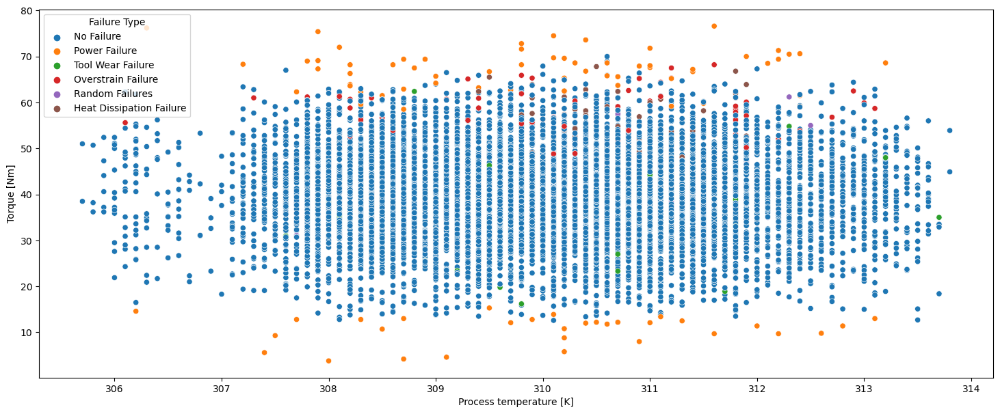

In [17]:
plt.figure(figsize=(18,7))
sb.scatterplot(data=df, y="Torque [Nm]", x="Process temperature [K]",  hue="Failure Type")

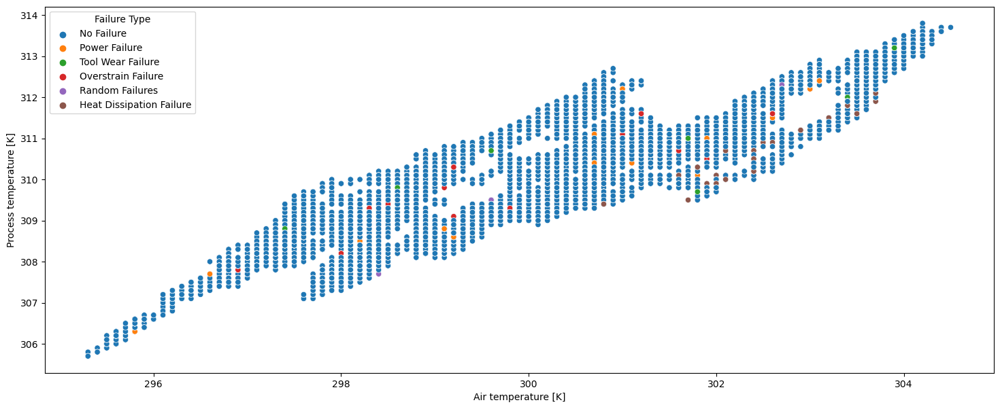

In [18]:
# Heat Failure erst ab bestimmtem Temperatur Wert. Umso höher Luft und Prozesstemperatur ist desto mehr Wärmeableitungs Failure
plt.figure(figsize=(18,7))
sb.scatterplot(data=df, x="Air temperature [K]", y="Process temperature [K]",  hue="Failure Type");

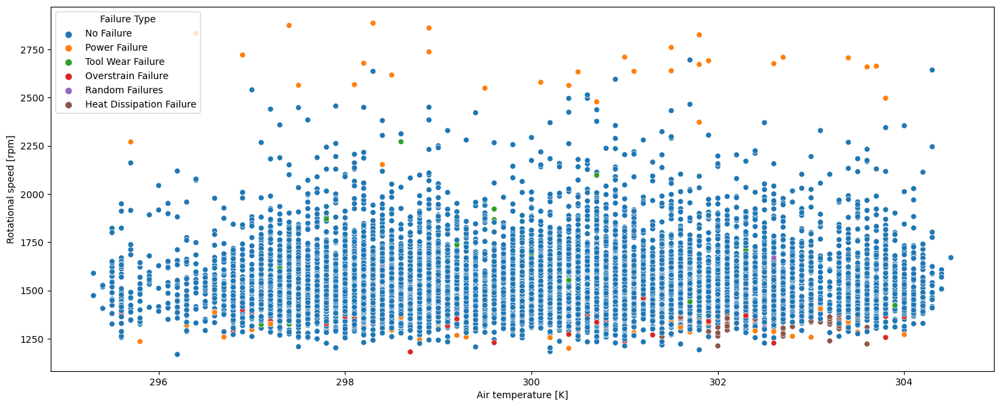

In [19]:
# man kann sehen, dass bei höher werdender Lufttemperatur die Anzahl an Wärmeableitungs Failure steigt  
plt.figure(figsize=(18,7))
sb.scatterplot(data=df, x="Air temperature [K]", y="Rotational speed [rpm]",  hue="Failure Type");

Index(['Type', 'Air temperature [K]', 'Process temperature [K]',
       'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', 'Target',
       'Failure Type'],
      dtype='object')


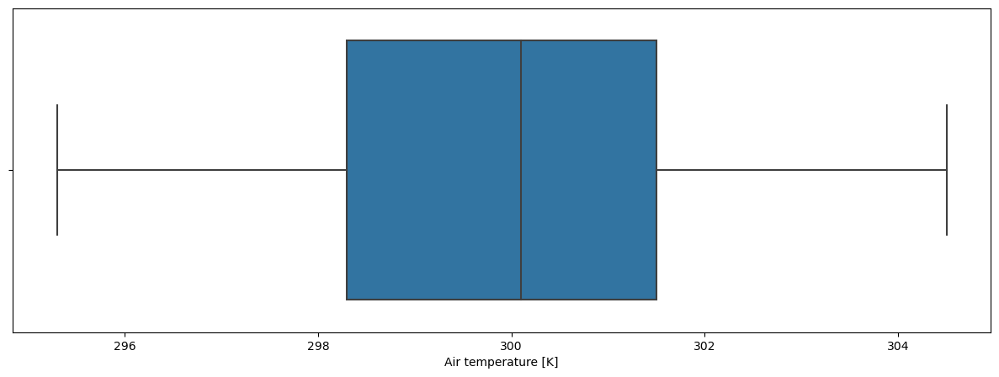

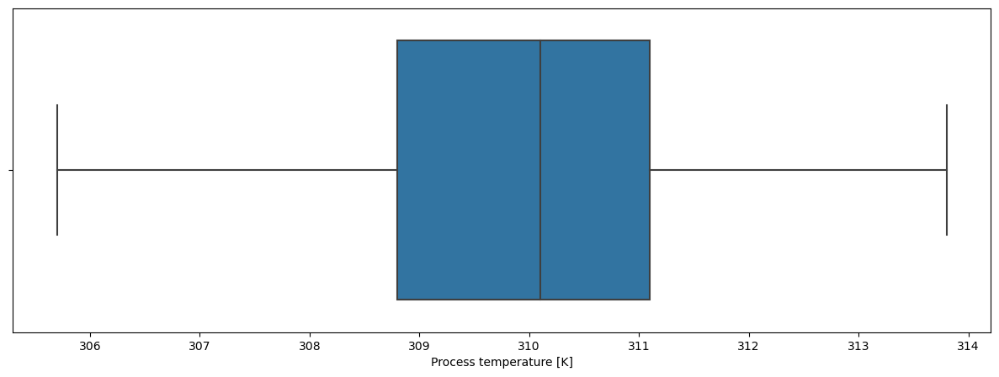

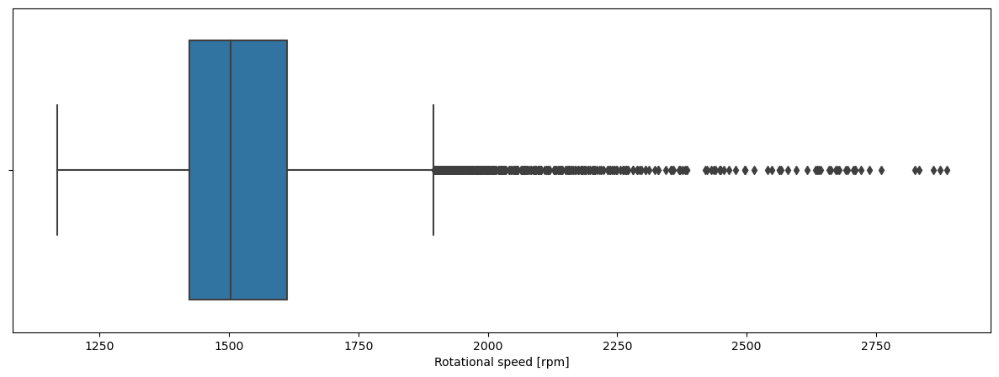

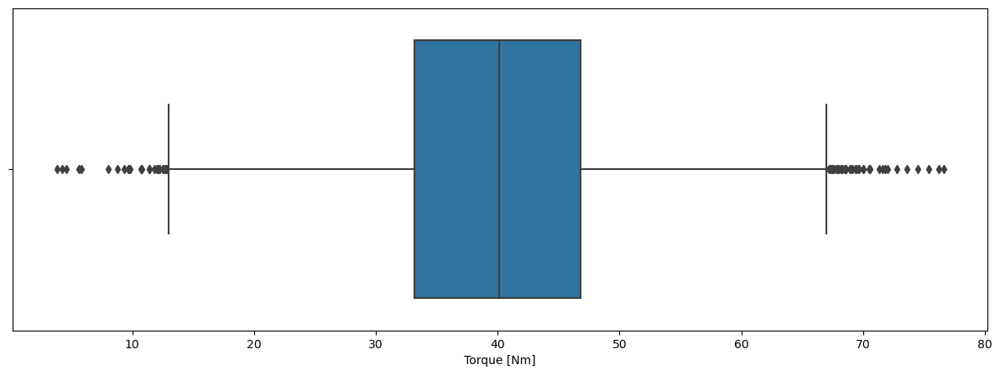

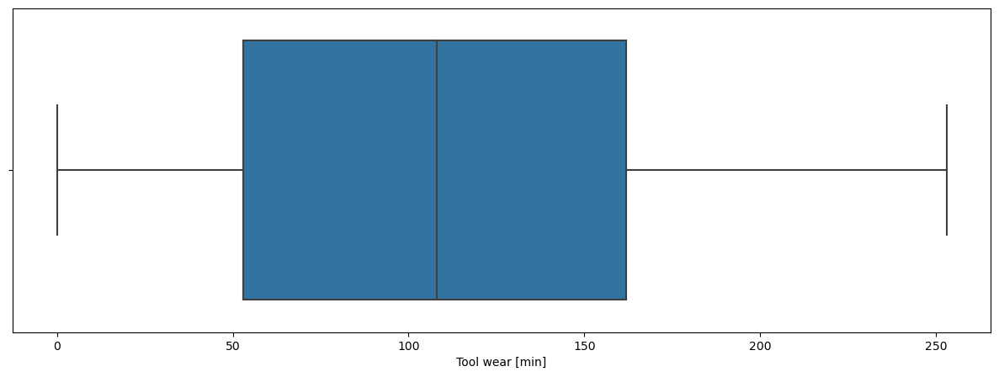

In [20]:
print(df.columns)
for index,column in enumerate(df.columns[1:-2]):
    plt.figure(index,figsize=(15,5))
    sb.boxplot(x=df[column])

Next, the distribution for the different product types is examined.

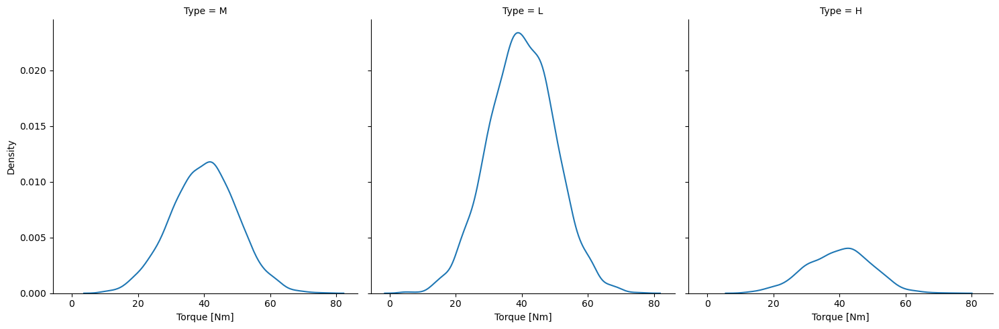

In [21]:
# alle Typen haben ähnliches Drehmoment und ähnliche Verteilung --> natürlich höhere Density weil es davon einfach mehr gibt
sb.displot(data=df, x="Torque [Nm]", col="Type", kind="kde");

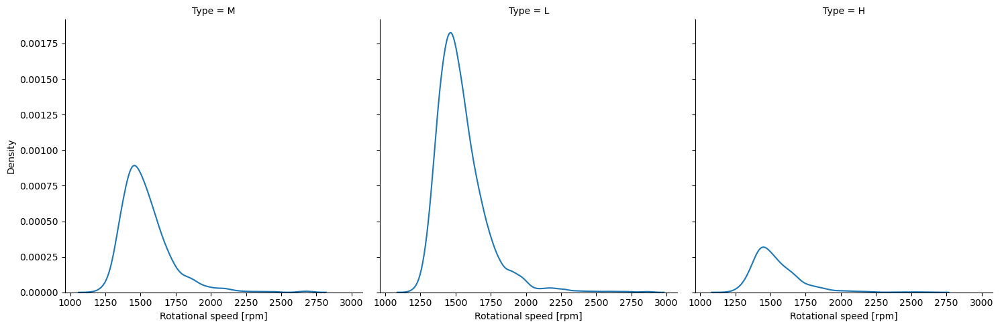

In [22]:
sb.displot(data=df, x="Rotational speed [rpm]", col="Type", kind="kde");

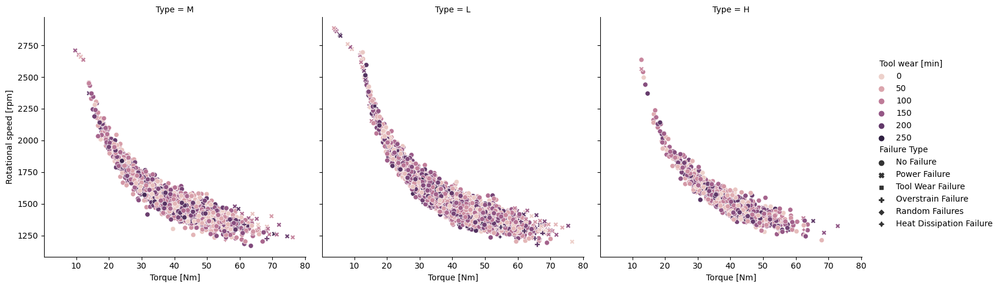

In [23]:
sb.relplot(data=df, x="Torque [Nm]", y="Rotational speed [rpm]", hue="Tool wear [min]" ,style="Failure Type",col="Type");

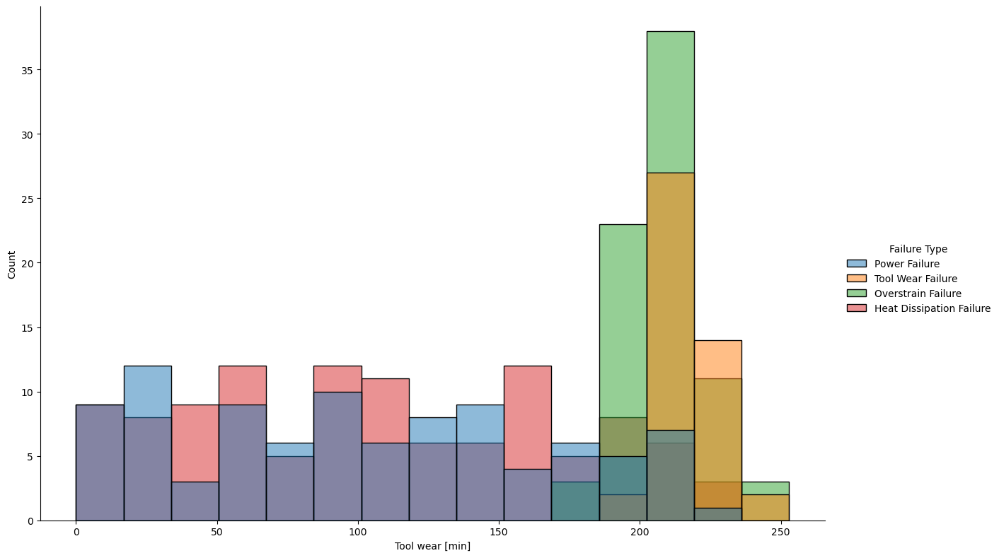

In [24]:
df_fail=df[df['Target']==1]
df_fail=df_fail[df_fail['Failure Type']!='No Failure']
sb.displot(data=df_fail, x="Tool wear [min]",hue="Failure Type", bins = 15,height = 8, aspect =1.5)

It can be seen that the tool's usage time has an impact on the type of failure. At the beginning, only "Power Failure" and "Heat Dissipation Failure" occur, whereas towards the end, "Tool Wear Failure" and "Overstrain Failure" also appear. Furthermore, it is again evident that the "Random Failures" are not considered as failures in the "Target" feature. For further analysis, the data points are visualized in chronological order.

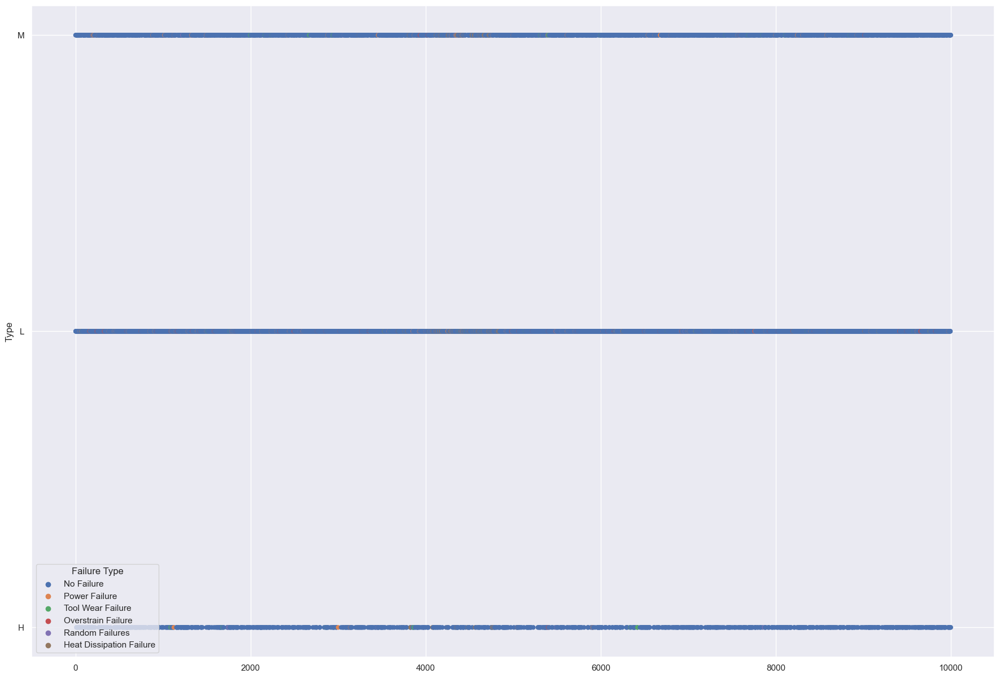

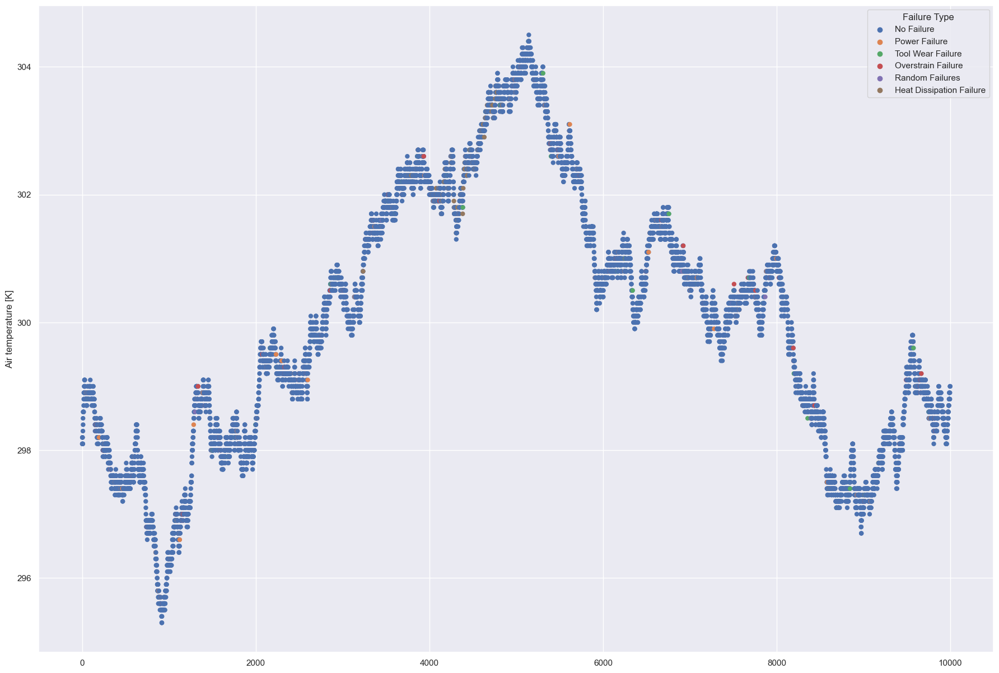

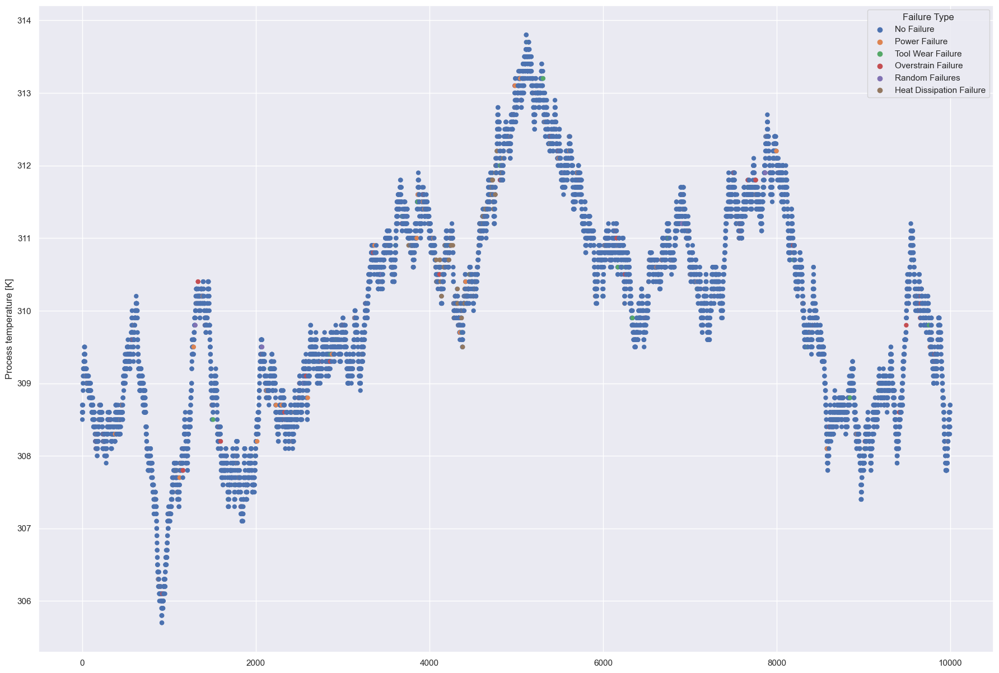

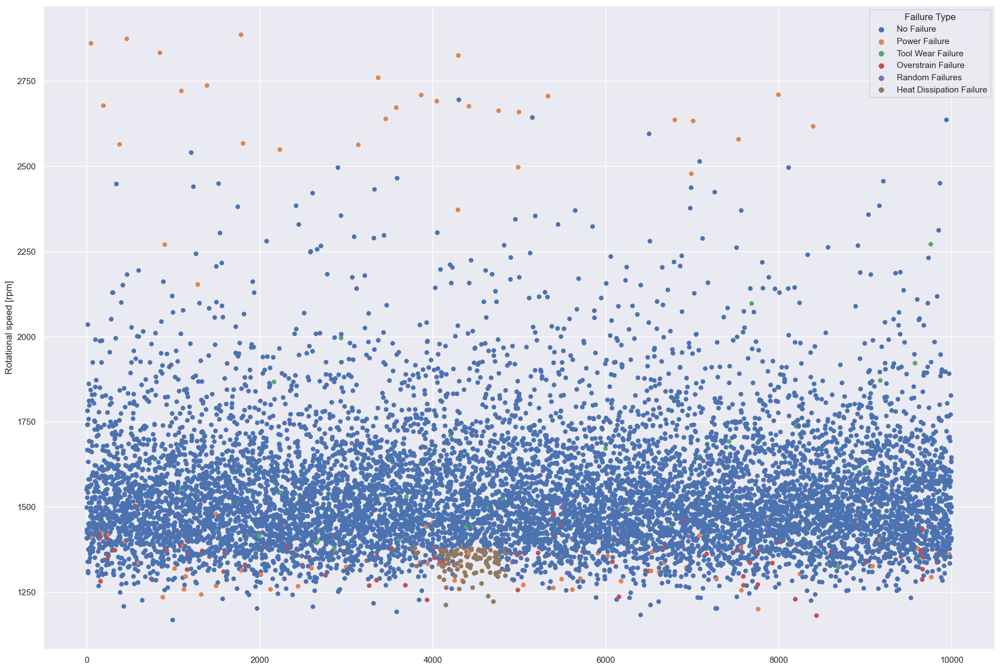

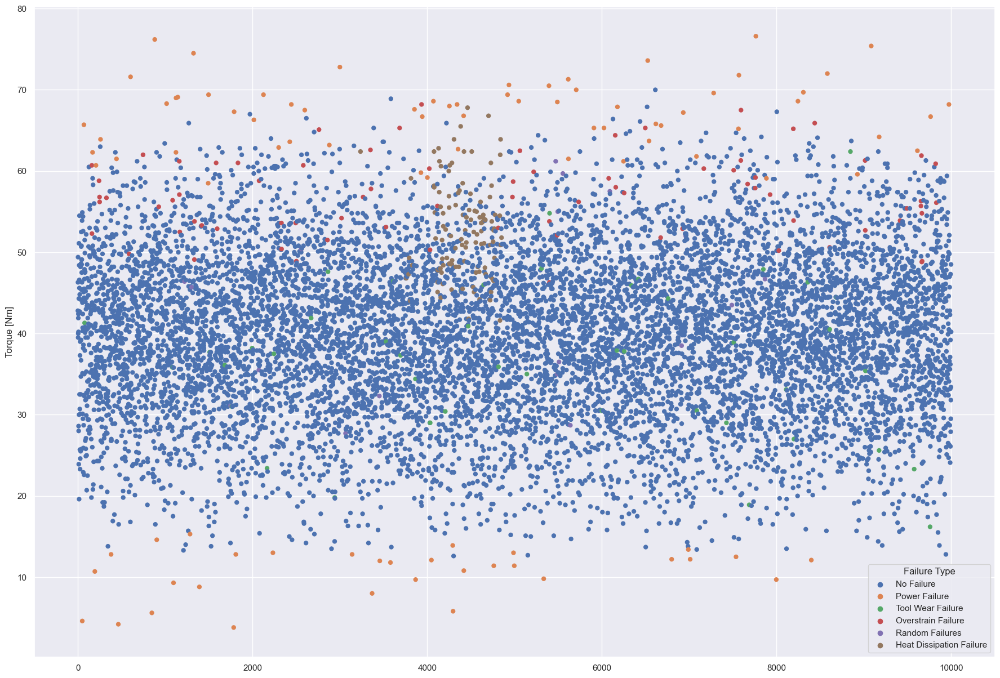

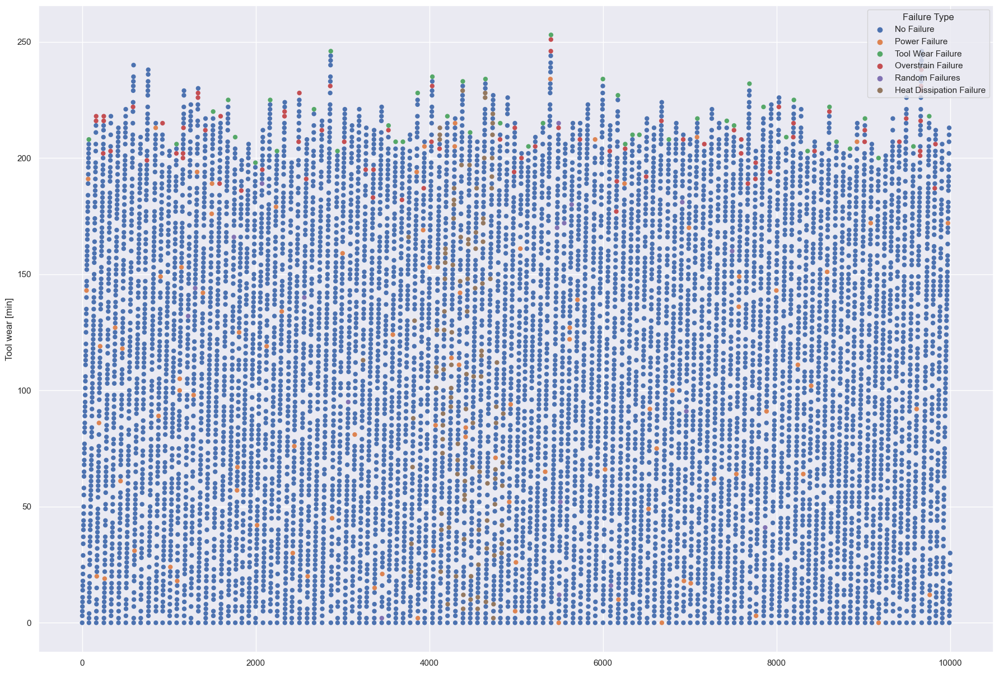

In [25]:
sb.set(font_scale=3.0)
sb.set(rc = {'figure.figsize':(22,15)})
columnsNonTarget = [i for i in df.columns if i not in ['Target','Failure Type','Product ID']]
for index,column in enumerate(columnsNonTarget):
        plt.figure(index)
        sb.scatterplot(data = df, x=df.index, y=column, hue='Failure Type',linewidth=0)

In the last visualization, it can be seen that "Tool wear" was frequently reset even without a "Tool Wear Failure" (green), indicating that the tool was apparently replaced even without a failure. This could complicate the prediction of the **Remaining Useful Lifetime (RUL)**.

# 3. Data Preparation

Data preprocessing is a crucial part of machine learning and predictive maintenance. The algorithms used, learn from the data they receive. Therefore, the output of these algorithms strongly depends on the input data. If the inputs are faulty or not meaningful, the algorithms will most likely produce a flawed or uninformative output, following the GIGO (Garbage in, Garbage Out) principle. 

Data preprocessing can be divided into 6 areas:
- [Data cleaning](#31-data-cleaning)
- [Data normalization](#32-data-normalization)
- [Data transformation](#33-data-transformation)
- [Missing value treatment](#34-missing-value-treatment)
- [Imbalanced data treatment](#35-imbalanced-data-treatment)
- [Feature engineering](#36-feature-engineering)


In [26]:
import numpy as np
import pandas as pd
import scipy as sp
from scipy.stats import chi2
from sklearn import preprocessing

## 3.1 Data cleaning

The first step of data preprocessing involves checking the dataset for outliers. The approach used is to calculate the Mahalanobis distances based on the chi-square statistic.

Covariance matrix is symmetric and positive definite.
Anzahl an Ausreißern: 194


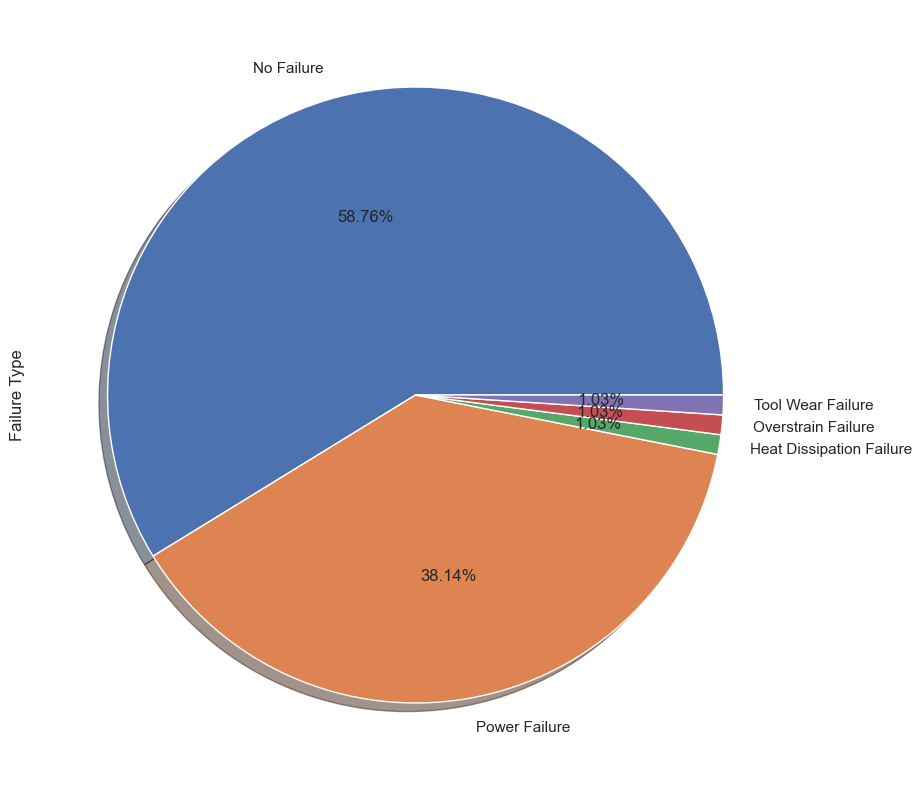

In [27]:
df_mahalanobis = df.iloc[:,1:6]
dof = len(df_mahalanobis.columns) # degrees of freedom k-1, where k is the number of features in the dataset
covariance_matrix = np.cov(df_mahalanobis, rowvar=False)
inv_covariance_matrix = np.linalg.inv(covariance_matrix)

#check if covariance matrix is symetric and positive definite
if np.allclose(inv_covariance_matrix, inv_covariance_matrix.T):
    try:
        np.linalg.cholesky(inv_covariance_matrix)
        print("Covariance matrix is symmetric and positive definite.")
    except np.linalg.LinAlgError:
        print("Covariance matrix isn't symmetric and positive definite.")
else:
    print("Covariance matrix isn't symmetric and positive definite.")

#mean centering
diff = df_mahalanobis - df_mahalanobis.mean()
left = np.dot(diff,inv_covariance_matrix)
mahal = np.dot(left,diff.T)
df_mahalanobis['Mahalanobis distance'] = mahal.diagonal()

#The p-value for each of the distances is the same as the p-value that belongs to the Chi-Square statistic of the Mahalanobis distance
df_mahalanobis['p'] = 1 - chi2.cdf(df_mahalanobis['Mahalanobis distance'], dof)

#outliers are where they p-value of the chi-square statistic is less than 0.01
df_mahalanobis["Failure Type"] = df["Failure Type"]
outlier = df_mahalanobis[df_mahalanobis['p']<0.01]
print("Anzahl an Ausreißern: " + str(len(outlier)))
plt.figure(figsize=(10,10))
outlier["Failure Type"].value_counts().plot.pie(autopct='%1.2f%%',shadow=True);

#new dataframe with cleaned data
#df_clean = df.drop(df.index[outlier.index])
df_clean = df


Using the Mahalanobis distance approach, around 200 data points are classified as outliers. This essentially serves as an initial classification of the data. A pie chart is used to visualize which failure types (e.g., No Failure, Power Failure, etc.) the outlier-classified data points belong to. About 59% of the outliers are actually non-failures (No Failure), representing the normal behavior of the machine. The remaining 41% are actual failures and are correctly identified as outliers. Therefore, the classification using Mahalanobis distance doesn't provide particularly good results. However, these outlying points are of interest to some methods and algorithms, as they contain valuable information about both the malfunctioning and normal behavior of the machine. As a result, these points are not removed from the dataset. Removing them could lead to bias, i.e., distortion of the data.

## 3.2 Data normalization

In this step, the data is standardized by subtracting the mean of the feature from all values and then dividing by the standard deviation. This process is also known as z-standardization.

In [28]:
df_stand = df_clean.copy()
standardScaler = preprocessing.StandardScaler()
df_stand.iloc[:,1:6] = standardScaler.fit_transform(df_stand.iloc[:,1:6])
df_stand

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,M,-0.952389,-0.947360,0.068185,0.282200,-1.695984,0,No Failure
1,L,-0.902393,-0.879959,-0.729472,0.633308,-1.648852,0,No Failure
2,L,-0.952389,-1.014761,-0.227450,0.944290,-1.617430,0,No Failure
3,L,-0.902393,-0.947360,-0.590021,-0.048845,-1.586009,0,No Failure
4,L,-0.902393,-0.879959,-0.729472,0.001313,-1.554588,0,No Failure
...,...,...,...,...,...,...,...,...
9995,M,-0.602417,-1.082162,0.363820,-1.052012,-1.476034,0,No Failure
9996,H,-0.552421,-1.082162,0.520005,-0.821283,-1.428902,0,No Failure
9997,M,-0.502425,-0.947360,0.592519,-0.660777,-1.350349,0,No Failure
9998,H,-0.502425,-0.879959,-0.729472,0.854005,-1.303217,0,No Failure


## 3.3 Data transformation

It can be useful to transform data using different methods to make them more closely resemble a normal distribution, as some algorithms perform better with such distributions. The approach chosen in this work is statistical transformation. Below, we check whether the data distribution exhibits skewness. The more skewed the distribution is, the less it resembles a normal distribution. First, this is demonstrated visually and then calculated. Finally, the data is transformed to make it closer to a normal distribution.

Air temperature [K]
0.11425677871921017
Process temperature [K]
0.015025013585136188
Rotational speed [rpm]
1.9928720166048546
Torque [Nm]
-0.009515168291199652
Tool wear [min]
0.027288145044006527


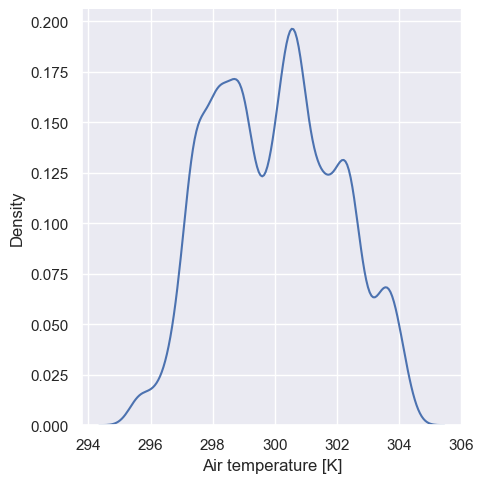

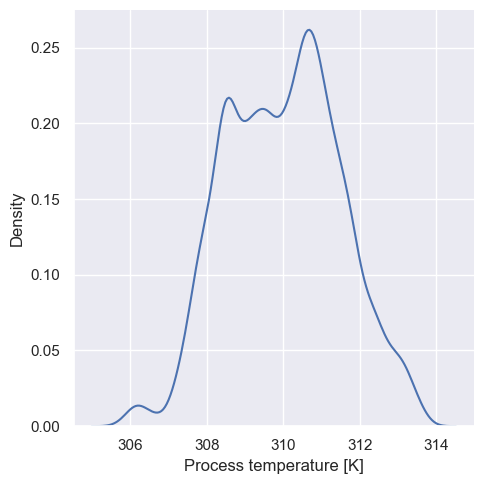

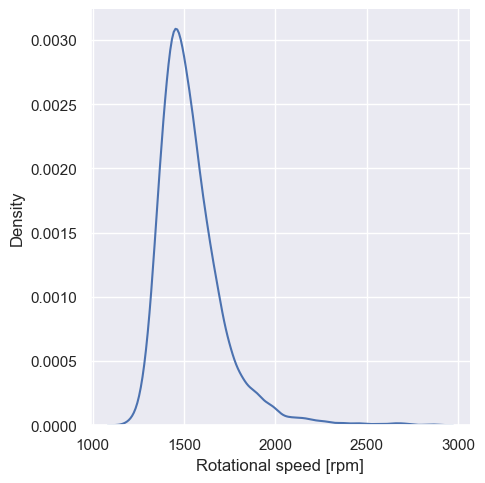

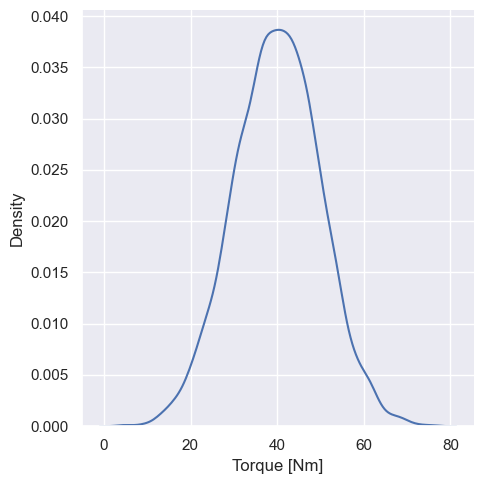

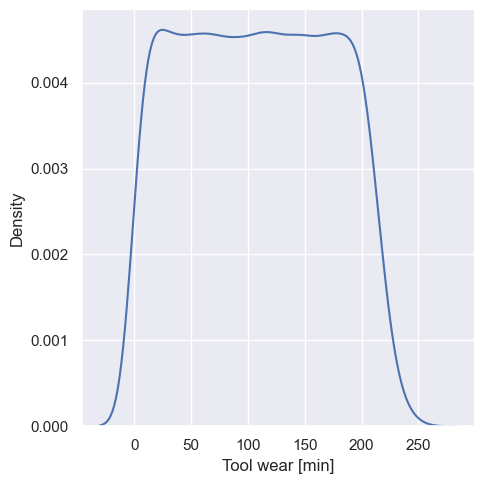

In [29]:
for column in df_clean.iloc[:,1:6].columns:
    sb.displot(data=df_clean[column], kind="kde");
    print(column)
    print(sp.stats.skew(df_clean[column]))

It can be seen that none of the variables are perfectly normally distributed. However, the torque closely resembles a Gaussian bell curve. There are both right-skewed and left-skewed data present. Statistical transformations can be applied to make the distributions of the data more closely resemble a Gaussian bell curve.

<br> **Rule of thumb for Skewness:**
- **Not skewed** when 0.25 > |x|
- **Weakly skewed** when 0.5 > |x|
- **Moderately skewed** when 1 > |x| 
- **Highly skewed** when 1 < |x| 

The direction of skewness is determined by the sign of x:  
- **Right-skewed** when x > 0
- **Left-skewed** when x < 0


In [30]:
df_trans = df_clean.copy() #deep copy
for column in df_trans.iloc[:,1:6].columns:
    print(column)
    skewness = sp.stats.skew(df_trans[column])
    print("Skewness vor Transformation = " + str(skewness))
    if skewness > 1 :
        print("Stark rechtsschief")
        print("Transformation mittels Berechnung der Inverse:")
        df_trans[column] = 1/df_trans[column]
    elif skewness >0.5:
        print("Mäßig rechtsschief")
        print("Transformation mittels Logarithmus:")
        df_trans[column] = np.log(df_trans[column])
    elif skewness > 0.25:
        print("Schwach rechtsschief")
        print("Transformation mittels Quadratwurzel:")
        df_trans[column] = np.sqrt(df_trans[column])
    elif skewness < -0.25:
        print("Schwach linksschief")
        print("Transformation mittels Quadratwurzel:")
        df_trans[column] = np.sqrt(df_trans[column].max()+1-df_trans[column])
    elif skewness < -0.5:
        print("Mäßig linksschief")
        print("Transformation mittels Quadratwurzel:")
        df_trans[column] = np.sqrt(df_trans[column].max()+1-df_trans[column])
    elif skewness < -1:
        print("Stark linksschief")
        print("Transformation mittels Inverse:")
        df_trans[column] = 1/(df_trans[column].max()+1-df_trans[column])
    else:
        print("Nicht transformiert")
    skewness = sp.stats.skew(df_trans[column])
    print("Skewness nach Transformation = " + str(skewness)+ ")\n")

Air temperature [K]
Skewness vor Transformation = 0.11425677871921017
Nicht transformiert
Skewness nach Transformation = 0.11425677871921017)

Process temperature [K]
Skewness vor Transformation = 0.015025013585136188
Nicht transformiert
Skewness nach Transformation = 0.015025013585136188)

Rotational speed [rpm]
Skewness vor Transformation = 1.9928720166048546
Stark rechtsschief
Transformation mittels Berechnung der Inverse:
Skewness nach Transformation = -0.7988017467587698)

Torque [Nm]
Skewness vor Transformation = -0.009515168291199652
Nicht transformiert
Skewness nach Transformation = -0.009515168291199652)

Tool wear [min]
Skewness vor Transformation = 0.027288145044006527
Nicht transformiert
Skewness nach Transformation = 0.027288145044006527)



The skewness is only higher than 0.25 for the feature "Rotational speed," indicating a strongly right-skewed distribution. A transformation using the inverse is chosen for this feature. After the transformation, the data becomes only moderately skewed, and thus, it is closer to a normal distribution. The distribution of this attribute is visualized again.

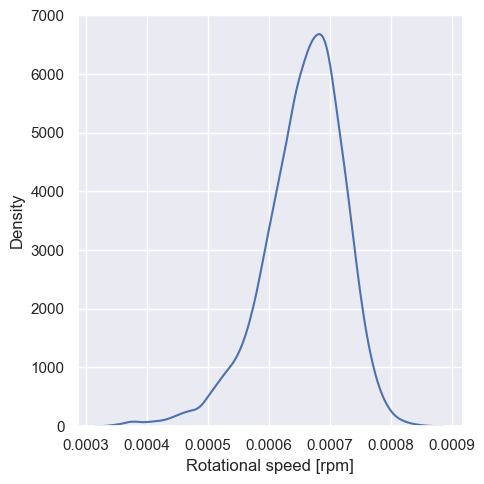

In [31]:
sb.displot(data=df_trans["Rotational speed [rpm]"], kind="kde")

Since the distribution of the data did not improve significantly (i.e., it did not become more similar to a normal distribution), the results of the neural networks and other models were not particularly good. However, for clarity, these results are not explicitly shown, and the code was executed multiple times with different underlying data. The standardized data, on the other hand, provided much better results, so from this point on, **only these standardized data will be used**.

## 3.4 Missing Value Treatment

Almost all algorithms cannot handle (partially) missing data. In the following, we will check if the dataset contains any missing values and then take appropriate measures to handle them.

In [32]:
df.info()

print("\nAnzahl fehlender Werte:")
df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Type                     10000 non-null  object 
 1   Air temperature [K]      10000 non-null  float64
 2   Process temperature [K]  10000 non-null  float64
 3   Rotational speed [rpm]   10000 non-null  int64  
 4   Torque [Nm]              10000 non-null  float64
 5   Tool wear [min]          10000 non-null  int64  
 6   Target                   10000 non-null  int64  
 7   Failure Type             10000 non-null  object 
dtypes: float64(3), int64(3), object(2)
memory usage: 625.1+ KB

Anzahl fehlender Werte:


Type                       0
Air temperature [K]        0
Process temperature [K]    0
Rotational speed [rpm]     0
Torque [Nm]                0
Tool wear [min]            0
Target                     0
Failure Type               0
dtype: int64

It can be seen that the dataset does not contain any missing values. To visualize this, a heatmap is also plotted to illustrate the result.

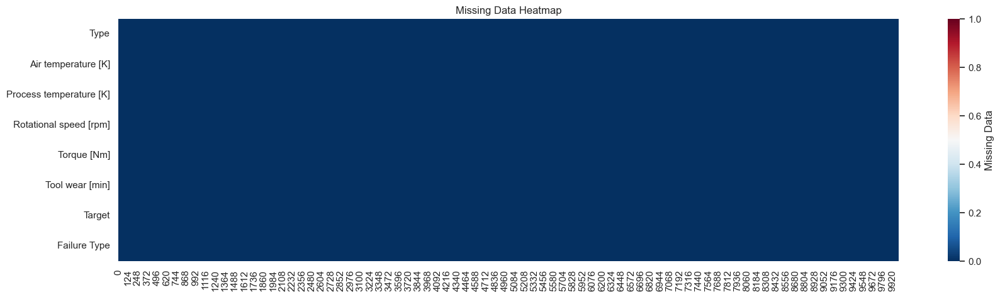

In [33]:
plt.figure(figsize=(20,5))
sb.heatmap(df_trans.isna().transpose(),
            cmap="RdBu_r",
            cbar_kws={'label': 'Missing Data'},
            vmin= 0.00,
            vmax = 1.00,
            robust=True,
            fmt = "f")
plt.title('Missing Data Heatmap')
plt.show()

The figure clearly shows that none of the 8 features contain missing values.

## 3.5 Feature engineering

Feature Engineering (also Feature Extraction) refers to the creation of derived features from the original variables. This often requires expert knowledge. However, there is a risk of bias if these engineered features are included in the model. Sometimes, it makes sense to perform feature engineering to better understand the data, but then discard these features afterward.

<Axes: xlabel='Rotational speed [rpm]', ylabel='Torque [Nm]'>

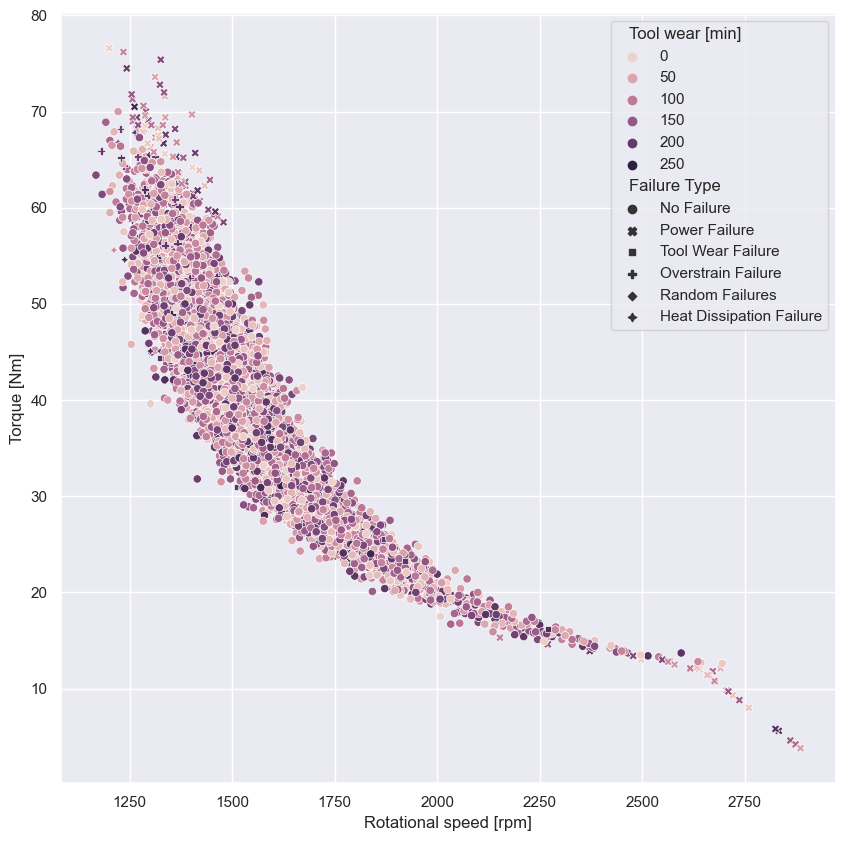

In [34]:
plt.figure(figsize=(10,10))
sb.scatterplot(data=df, y="Torque [Nm]", x="Rotational speed [rpm]",  hue="Tool wear [min]" ,style="Failure Type")

The above figure, with rotational speed on the x-axis and torque on the y-axis, clearly shows the power failure. The power is calculated by multiplying rotational speed and torque: 

$$ P = \overrightarrow{M} * \overrightarrow{\omega} $$

Where $\overrightarrow{M}$ is the torque in $Nm$, $\overrightarrow{\omega}$ is the rotational speed in $\frac{1}{s}$, and $P$ is the power in watts (W). 

Can a rotational speed-torque characteristic curve be developed that uses a threshold to prevent a power failure?


===MEAN===
Air temperature [K]         300.075789
Process temperature [K]     309.954737
Rotational speed [rpm]     1763.968421
Torque [Nm]                  48.514737
Tool wear [min]             101.884211
Target                        1.000000
Power [W]                  7250.454060
dtype: float64
===STD===
Air temperature [K]           2.147127
Process temperature [K]       1.600450
Rotational speed [rpm]      620.829138
Torque [Nm]                  26.788653
Tool wear [min]              64.355704
Target                        0.000000
Power [W]                  3086.783300
dtype: float64


C:\Users\koehl\AppData\Local\Temp\ipykernel_20036\970168607.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfPower["Power [W]"] = dfPower["Rotational speed [rpm]"]/60.0*2*3.141 * dfPower["Torque [Nm]"]
C:\Users\koehl\AppData\Local\Temp\ipykernel_20036\970168607.py:5: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(dfPower.mean())
C:\Users\koehl\AppData\Local\Temp\ipykernel_20036\970168607.py:7: FutureWarning: The default value of numeric_only in DataFrame.std is deprecated. In a future version, it will default

<Axes: xlabel='Tool wear [min]', ylabel='Power [W]'>

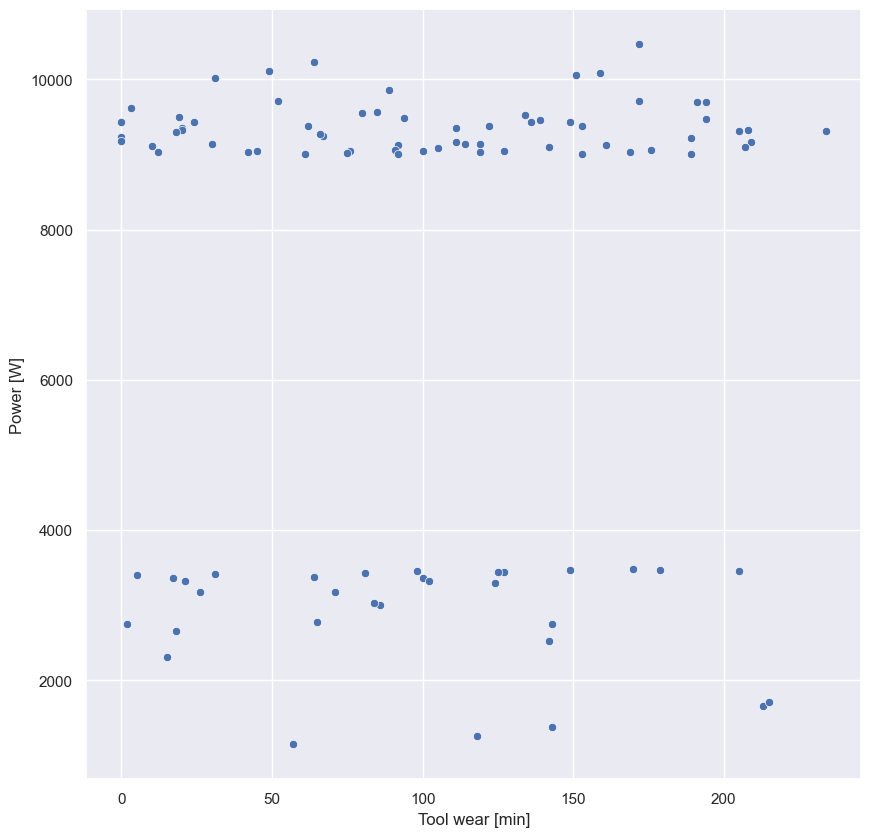

In [35]:
dfPower = df[df['Failure Type']=='Power Failure']
dfPower["Power [W]"] = dfPower["Rotational speed [rpm]"]/60.0*2*3.141 * dfPower["Torque [Nm]"]
plt.figure(figsize=(10,10))
print("===MEAN===")
print(dfPower.mean())
print("===STD===")
print(dfPower.std())
dfPower.sort_values(by="Power [W]")
sb.scatterplot(data=dfPower,x="Tool wear [min]", y="Power [W]")


The relationship between torque and rotational speed does not match here. In some cases, a power failure occurs before 2000 watts, and in other cases, it happens only after 10000 watts. 

Therefore, it is likely not a classical power failure but rather a limitation of the motor. 

A simple mathematical function cannot be developed. Since multiplication, unlike, for example, a Fourier transform, is a simple mathematical operation, the applied machine learning techniques should be able to handle the data well without the power value as an additional feature.

## 3.6 Imbalanced data treatment

First, the distribution of the two features "Target" and "Failure Type" is examined. It is clearly noticeable that there is a significant imbalance in the data. The values 0 (= No Failure) and "No Failure" occur much more frequently than the failure classes. In the following, different methods for handling imbalanced data will be compared. Therefore, various algorithms will be used in this chapter.

In [36]:
from imblearn.over_sampling import RandomOverSampler #pip install imbalanced-learn
from imblearn.over_sampling import SMOTE, SMOTENC
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import numpy as np

### 3.6.1 Vorhersage des Merkmals "Failure Type"

The preprocessed data used below will be used to predict the feature "Failure Type." As mentioned earlier, using standardized data results in significantly better outcomes compared to the statistically transformed data. For this reason, the decision is made to continue using the standardized data.

In [37]:
#dfNN = df_trans.drop(["Target"],axis=1)
dfNN = df_stand.drop(["Target"],axis=1)

columnsX = [i for i in dfNN.columns if i!="Failure Type"]
columnsY = "Failure Type"
print("features used for prediction:",columnsX)
print("predicted feature:",columnsY)

features used for prediction: ['Type', 'Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]']
predicted feature: Failure Type


The number of failure types is now examined again.

Text(0.5, 1.0, 'Type')

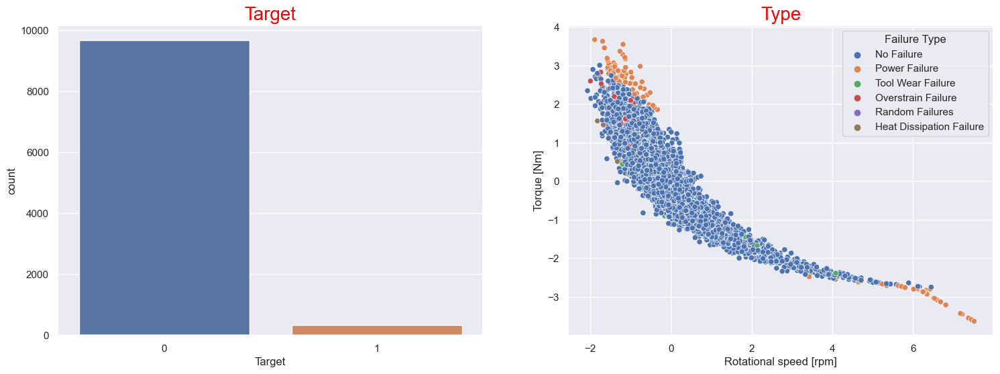

In [38]:
ax = plt.figure(figsize=(18,6))
ax = plt.subplot(1,2,1)
ax = sb.countplot(x='Target', data=df_stand)
#ax.bar_label(ax.containers[0])
plt.title("Target", fontsize=20,color='Red')
ax =plt.subplot(1,2,2)
ax= sb.scatterplot(y='Torque [Nm]',x="Rotational speed [rpm]",data=df_stand, hue="Failure Type")
ax.set_title(label = "Type", fontsize = 20,color='Red')

It can be seen that there is a clear imbalance between failures and no failures. The scatter plot shows that there seem to be significantly more "Power Failures" than "Overstrain Failures." It is possible that the failure types are also unevenly distributed. The distribution of the different failure types will now be examined in more detail.

No Failure                  9652
Heat Dissipation Failure     112
Power Failure                 95
Overstrain Failure            78
Tool Wear Failure             45
Random Failures               18
Name: Failure Type, dtype: int64


Text(0.5, 1.0, 'Failure Type')

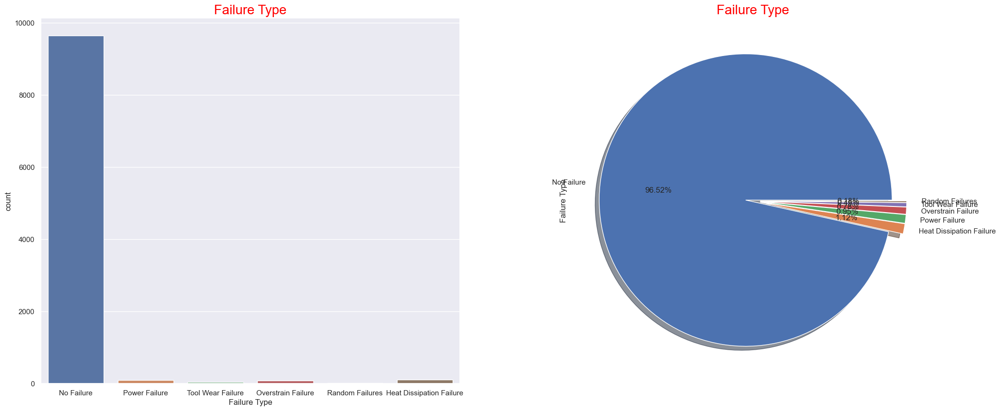

In [39]:
#visualize distribution of the failure type
ax = plt.figure(figsize=(25,10))
ax = plt.subplot(1,2,1)
ax = sb.countplot(x='Failure Type', data=df)
#ax.bar_label(ax.containers[0])
print(dfNN['Failure Type'].value_counts())
plt.title("Failure Type", fontsize=20,color='Red')
ax =plt.subplot(1,2,2)
ax=dfNN['Failure Type'].value_counts().plot.pie(explode=[0.05, 0.05,0.05,0.05, 0.05,0.05],autopct='%1.2f%%',shadow=True);
ax.set_title(label = "Failure Type", fontsize = 20,color='Red')

A total of approximately 96.5% of the datasets represent normal machine behavior, and each failure type constitutes a maximum of 1.12% of the overall data. The assumption that the distribution within the failure types is also unevenly distributed is confirmed. Therefore, an Imbalanced Data Treatment is definitely necessary to avoid issues such as overfitting. During model training, this can become a problem as it might lead to "memorization" rather than learning. 

As a first attempt, random duplication of the underrepresented classes will be performed. Note: Before applying oversampling techniques, the data should always be split into test and training datasets, as failure to do so can quickly lead to poor generalization on the test data.

In [40]:
#train_test_split before the imbalanced data treatment to avoid same datasets in test and train set
#model specific data preprocessing
encoderX = LabelEncoder()
dfNN['Type'] = encoderX.fit_transform(dfNN['Type'])
y = dfNN["Failure Type"]
x = dfNN[columnsX]

#categorize the labels
encoderY = LabelEncoder()
yLabel = encoderY.fit_transform(y)

print("x:\n",x)
print("y:\n",yLabel)
#split data into train and test data
x_train, x_test, y_train, y_test = train_test_split(x, yLabel, test_size = 0.3)

x:
       Type  Air temperature [K]  Process temperature [K]  \
0        2            -0.952389                -0.947360   
1        1            -0.902393                -0.879959   
2        1            -0.952389                -1.014761   
3        1            -0.902393                -0.947360   
4        1            -0.902393                -0.879959   
...    ...                  ...                      ...   
9995     2            -0.602417                -1.082162   
9996     0            -0.552421                -1.082162   
9997     2            -0.502425                -0.947360   
9998     0            -0.502425                -0.879959   
9999     2            -0.502425                -0.879959   

      Rotational speed [rpm]  Torque [Nm]  Tool wear [min]  
0                   0.068185     0.282200        -1.695984  
1                  -0.729472     0.633308        -1.648852  
2                  -0.227450     0.944290        -1.617430  
3                  -0.590021   

Before performing oversampling, the distribution of the training dataset will be reviewed again to ensure that no failure type is missing entirely from the data. This check helps ensure that every failure type is represented in the training dataset before applying any adjustments to address class imbalances.

In [41]:
#visualize distribution of the failure type --TRAINING DATA
dfVis = pd.DataFrame(x_train,columns=columnsX)
dfVis['Failure Type'] = y_train
print(dfVis['Failure Type'].value_counts())
"""
ax = plt.figure(figsize=(25,10))
ax = plt.subplot(1,2,1)
ax = sb.countplot(x='Failure Type', data=dfVis)
ax.bar_label(ax.containers[0])
plt.title("Failure Type", fontsize=20,color='Red')
ax =plt.subplot(1,2,2)
ax=dfVis['Failure Type'].value_counts().plot.pie(explode=[0.05, 0.05,0.05,0.05, 0.05,0.05],autopct='%1.2f%%',shadow=True)
ax.set_title(label = "Failure Type", fontsize = 20,color='Red')
"""

1    6748
0      78
3      75
2      57
5      32
4      10
Name: Failure Type, dtype: int64


'\nax = plt.figure(figsize=(25,10))\nax = plt.subplot(1,2,1)\nax = sb.countplot(x=\'Failure Type\', data=dfVis)\nax.bar_label(ax.containers[0])\nplt.title("Failure Type", fontsize=20,color=\'Red\')\nax =plt.subplot(1,2,2)\nax=dfVis[\'Failure Type\'].value_counts().plot.pie(explode=[0.05, 0.05,0.05,0.05, 0.05,0.05],autopct=\'%1.2f%%\',shadow=True)\nax.set_title(label = "Failure Type", fontsize = 20,color=\'Red\')\n'

The distribution of the training data closely mirrors that of the overall dataset. Logically, there is still an extreme imbalance between failures and no failures. However, each class is represented at least once. In the next step, random oversampling will be applied to address this imbalance.

In [42]:
#OVERSAMPLING ALL NOT MAJORITY CLASSES
oversample = RandomOverSampler(sampling_strategy='not majority')

x_trainOS, y_trainOS = oversample.fit_resample(x_train,y_train)
x_testOS, y_testOS = oversample.fit_resample(x_test,y_test)

1    6748
5    6748
0    6748
3    6748
2    6748
4    6748
Name: Failure Type, dtype: int64


Text(0.5, 1.0, 'Failure Type')

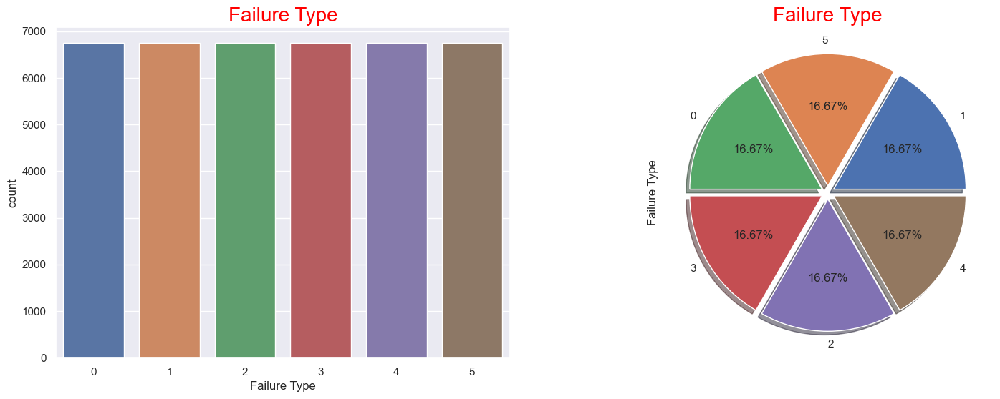

In [43]:
#visualize distribution of the failure type --TRAINING DATA -> identical to TEST DATA
dfVis = pd.DataFrame(x_trainOS,columns=columnsX)
dfVis['Failure Type'] = y_trainOS
print(dfVis['Failure Type'].value_counts())
ax = plt.figure(figsize=(18,6))
ax = plt.subplot(1,2,1)
ax = sb.countplot(x='Failure Type', data=dfVis)
#ax.bar_label(ax.containers[0])
plt.title("Failure Type", fontsize=20,color='Red')
ax =plt.subplot(1,2,2)
ax=dfVis['Failure Type'].value_counts().plot.pie(explode=[0.05, 0.05,0.05,0.05, 0.05,0.05],autopct='%1.2f%%',shadow=True)
ax.set_title(label = "Failure Type", fontsize = 20,color='Red')

It is now clear that all failure types have the same number of data points and are thus evenly distributed.  
However, random duplication (oversampling) of data points does not bring additional information (variance), and overfitting can still occur. Another approach is oversampling using the SMOTE algorithm. The SMOTE algorithm selects samples that are in the feature space and draws a virtual line between two samples of the same class. A new data point is randomly generated on this line and assigned to the same class. This increases the information gain without duplicating data points.

In [44]:
#SMOTE ALL NOT MAJORITY CLASSES

#because of the low amount of the failure classes, there is a chance that
#there are less label members than needed for the SMOTE algorithm
#thats why there is a try catch implementation
bSMOTE = False
while not bSMOTE:
    try:
        oversample = SMOTE(sampling_strategy='not majority',random_state=1)
        steps = [('o', oversample)]
        pipeline = Pipeline(steps=steps)

        x_trainSMOTE, y_trainSMOTE = pipeline.fit_resample(x_train, y_train)

        oversample = SMOTE(sampling_strategy='not majority',k_neighbors=3,random_state=1)
        steps = [('o', oversample)]
        pipeline = Pipeline(steps=steps)
        x_testSMOTE, y_testSMOTE = pipeline.fit_resample(x_test, y_test)

        bSMOTE = True
    except:
        #maybe its a better idea to test the splitting for enough label members
        x_train, x_test, y_train, y_test = train_test_split(x, yLabel, test_size = 0.3)


The distribution of the data oversampled with the SMOTE algorithm is once again displayed in both a bar chart and a scatter plot to verify that balance has now been achieved.

Text(0.5, 1.0, 'Type')

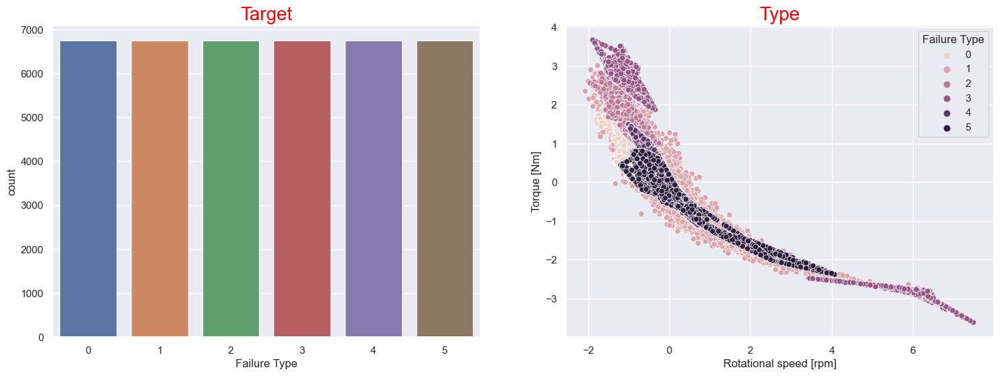

In [45]:
dfVis = pd.DataFrame(x_trainSMOTE,columns=columnsX)
dfVis['Failure Type'] = y_trainSMOTE
ax = plt.figure(figsize=(18,6))
ax = plt.subplot(1,2,1)
ax = sb.countplot(x='Failure Type', data=dfVis)
plt.title("Target", fontsize=20,color='Red')
ax =plt.subplot(1,2,2)
ax= sb.scatterplot(y='Torque [Nm]',x="Rotational speed [rpm]",data=dfVis,hue="Failure Type")
ax.set_title(label = "Type", fontsize = 20,color='Red')

The failure types are now evenly distributed, but instead of creating exact copies of data points, new and similar data points were generated. This is clearly visible in the scatter plot. These data will be used in the section [4.1.1](#411-identifying-the-feature-failure-type) for predicting the "Failure Type" feature.

### 3.6.2 Vorhersage des Merkmals "Target"

In this section, the data for predicting the "Target" feature will be preprocessed. Only the standardized data will continue to be used.

In [46]:
#drop unnecessary columns
dfNN = df_stand.drop(["Failure Type"],axis=1)

columnsXT = [i for i in dfNN.columns if i!="Target"]
columnsY = "Target"
print("features used for prediction:",columnsXT)
print("predicted feature:",columnsY)

features used for prediction: ['Type', 'Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]']
predicted feature: Target


The data will once again be split into 70% training data and 30% test data. The "Type" feature must also be converted back into integers.

In [47]:

encoderX = LabelEncoder()
dfNN['Type'] = encoderX.fit_transform(dfNN['Type'])
y_T = dfNN[columnsY]
x_T = dfNN[columnsXT]

#categorize the labels
encoderYT = LabelEncoder()
yLabelT = encoderYT.fit_transform(y_T)

print("x:\n",x_T)
print("y:\n",yLabelT)
#split data into train and test data
x_trainT, x_testT, y_trainT, y_testT = train_test_split(x_T, yLabelT, test_size = 0.3)

x:
       Type  Air temperature [K]  Process temperature [K]  \
0        2            -0.952389                -0.947360   
1        1            -0.902393                -0.879959   
2        1            -0.952389                -1.014761   
3        1            -0.902393                -0.947360   
4        1            -0.902393                -0.879959   
...    ...                  ...                      ...   
9995     2            -0.602417                -1.082162   
9996     0            -0.552421                -1.082162   
9997     2            -0.502425                -0.947360   
9998     0            -0.502425                -0.879959   
9999     2            -0.502425                -0.879959   

      Rotational speed [rpm]  Torque [Nm]  Tool wear [min]  
0                   0.068185     0.282200        -1.695984  
1                  -0.729472     0.633308        -1.648852  
2                  -0.227450     0.944290        -1.617430  
3                  -0.590021   

In the next step, the training and test data will be oversampled again using the SMOTE algorithm.

In [48]:
#SMOTE for training and test data
#TRAINING DATA
oversample = SMOTE(sampling_strategy='not majority')
steps = [('o', oversample)]
pipeline = Pipeline(steps=steps)
x_trainT, y_trainT = pipeline.fit_resample(x_trainT, y_trainT)

#TEST DATA with less neighbors (because samples has to higher than k_nn)
oversample = SMOTE(sampling_strategy='not majority',k_neighbors=3)
steps = [('o', oversample)]
pipeline = Pipeline(steps=steps)
x_testT, y_testT = pipeline.fit_resample(x_testT, y_testT)

These data will be used in Chapter [4.1.2](#412-identifying-the-feature-target) to predict the "Target" feature.

### 3.6.3 Vorhersage des Merkmals "Tool wear"

The following data will be preprocessed for predicting the "Tool wear" feature in Chapter [4.1.3](#413-predicting-the-feature-tool-wear).

In [49]:
df2 = df_stand.drop(["Failure Type","Target"],axis=1)

columnsXTW = [i for i in df2.columns if i!="Tool wear [min]"]
columnsYTW = "Tool wear [min]"
print("features used for prediction:",columnsXTW)
print("predicted feature:",columnsYTW)

features used for prediction: ['Type', 'Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]']
predicted feature: Tool wear [min]


In [50]:
encoderX = LabelEncoder()
df2['Type'] = encoderX.fit_transform(df2['Type'])
y = df2[columnsYTW]
x = df2[columnsXTW]


print("x:\n",x)
print("y:\n",y)
#split data into train and test data
x_trainTW, x_testTW, y_trainTW, y_testTW = train_test_split(x, y, test_size = 0.3)

x:
       Type  Air temperature [K]  Process temperature [K]  \
0        2            -0.952389                -0.947360   
1        1            -0.902393                -0.879959   
2        1            -0.952389                -1.014761   
3        1            -0.902393                -0.947360   
4        1            -0.902393                -0.879959   
...    ...                  ...                      ...   
9995     2            -0.602417                -1.082162   
9996     0            -0.552421                -1.082162   
9997     2            -0.502425                -0.947360   
9998     0            -0.502425                -0.879959   
9999     2            -0.502425                -0.879959   

      Rotational speed [rpm]  Torque [Nm]  
0                   0.068185     0.282200  
1                  -0.729472     0.633308  
2                  -0.227450     0.944290  
3                  -0.590021    -0.048845  
4                  -0.729472     0.001313  
...        

# 4. Modeling

In this chapter, various tools and models from the fields of data mining and machine learning are used to identify patterns and relationships within the data. These methods aim to enable anomaly detection and predictive maintenance of the system. First, in Chapter [4.1](#41-training-a-neural-network-for-anomaly-detection), neural networks are used to identify the failure types of the system. In Chapter [4.2](#42-training-a-decision-tree-for-anomaly-detection), decision trees are employed for anomaly detection. This is followed by Chapter [4.3](#43-predictive-maintenance), which covers predictive maintenance using a neural network, a self-organizing map (SOM), and principal component analysis (PCA).

## 4.1 Training eines neuronalen Netzes zur Anomalieerkennung

In this subsection, various neural networks are trained for anomaly detection. In Chapter [4.1.1](#411-identifying-the-feature-failure-type), a neural network is trained to predict the failure type based on the given features. The different techniques presented in Chapter [3.6](#36-imbalanced-data-treatment) are compared in this context. The prediction of the failure, independent of the failure type, is covered in Chapter [4.1.2](#412-identifying-the-feature-target). Finally, in Chapter [4.1.3](#413-predicting-the-feature-tool-wear), a neural network is trained to predict the tool wear duration.

In [51]:
import tensorflow as tf
from keras.layers import Input, Conv2D, Activation, MaxPool2D, Flatten, Dense, Dropout, BatchNormalization, Softmax
from keras.models import Sequential
from keras import callbacks, regularizers
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix

### 4.1.1 Identifizieren des Mermals "Failure Type"

In this chapter, a neural network is trained to predict the type of failure (the feature "Failure Type"). First, the structure and evaluation of the neural network are generalized into functions.

In [52]:
def defineModel(lenX, lenY):
    """
    defines the structure of a feed forward neural network
    """
    # Build simple model feed forward network [Classification]
    model = Sequential()
    model.add(Input(shape=(lenX,))) #first layer -> number of input neurons = number of features
    model.add(Dense(30, activation="relu")) #second layer -> 40 neurons
    model.add(Dense(30,activation="relu")) #third layer -> 40 neurons
    model.add(Dense(lenY, activation="softmax")) #last layer -> number of output neurons = number failure types

    # print model summary
    model.summary()

    # compile the model
    model.compile(
        optimizer = "adam", 
        loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False), 
        metrics=[tf.keras.metrics.SparseCategoricalAccuracy()])

    # early-stop callback -> stop the training before max epochs are reached for specified condition
    early_stopping = callbacks.EarlyStopping(
        monitor = 'loss',
        min_delta = 0.03,
        patience = 4,
        restore_best_weights=True
    )
    return model, early_stopping

def defineRegressionModel(lenX,lenY):
    # Build simple model feed forward network [Regression]
    model = Sequential()
    model.add(Input(shape=(lenX,))) #first layer -> number of input neurons = number of features
    model.add(Dense(20, activation="relu")) #second layer -> 40 neurons
    model.add(Dense(20,activation="relu")) #third layer -> 40 neurons
    model.add(Dense(lenY)) #last layer -> number of output neurons usually one

    # print model summary
    model.summary()

    # compile the model
    model.compile(
        optimizer = "adam", 
        loss=tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error"), #take the mean squared error between real and predicted value as a loss function
        metrics=[tf.keras.metrics.MeanAbsoluteError(),tf.keras.losses.MeanSquaredError()])

    # early-stop callback
    early_stopping = callbacks.EarlyStopping(
        monitor = 'loss',
        min_delta = 0.03,
        patience = 10,
        restore_best_weights=True
    )
    return model, early_stopping

def evaluateModel(model,x_test,y_test,enc=None):
    predictions = model.predict(x_test)
    y_pred = []
    #predict the label with the neural network
    for i in predictions:
        y_pred.append(np.array(i).argmax())  #label with highest probability
    if enc:
        #decode label
        y_test_transform = enc.inverse_transform(y_test)
        y_pred_transform = enc.inverse_transform(y_pred)
    else:
        y_test_transform = y_test
        y_pred_transform = y_pred

    #classfication report with precision, recall and f1-score
    report = classification_report(y_test_transform, y_pred_transform)
    print(report)

    #confusion matrix (allocation between true and predicted label)
    sortedLabels = sorted(set(y_test_transform))
    ax = plt.figure(figsize=(10,10))
    ax = sb.heatmap(confusion_matrix(y_test_transform,y_pred_transform),square=True,annot=True,cmap="vlag",xticklabels=sortedLabels, yticklabels=sortedLabels)
    ax.set(xlabel='predicted label', ylabel='true label')
    plt.show()

The following neural network is trained with the unbalanced data. The splitting of the data into training and test sets and the selection of features are explained in section [3.6.1](#361-vorhersage-des-merkmals-failure-type).

In [53]:
#neural network with raw data (no imbalanced data treatment)
modelRaw,early_stopping = defineModel(len(columnsX),len(set(y_train)))
history = modelRaw.fit(
    x_train,
    y_train,
    validation_data=(x_test, y_test), 
    callbacks=[early_stopping],
    epochs = 20)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 30)                210       
                                                                 
 dense_1 (Dense)             (None, 30)                930       
                                                                 
 dense_2 (Dense)             (None, 6)                 186       
                                                                 
Total params: 1,326
Trainable params: 1,326
Non-trainable params: 0
_________________________________________________________________


Epoch 1/20
219/219 [==============================] - 1s 3ms/step - loss: 0.5194 - sparse_categorical_accuracy: 0.8966 - val_loss: 0.1990 - val_sparse_categorical_accuracy: 0.9680
Epoch 2/20
219/219 [==============================] - 0s 2ms/step - loss: 0.1882 - sparse_categorical_accuracy: 0.9641 - val_loss: 0.1613 - val_sparse_categorical_accuracy: 0.9680
Epoch 3/20
219/219 [==============================] - 0s 2ms/step - loss: 0.1556 - sparse_categorical_accuracy: 0.9649 - val_loss: 0.1430 - val_sparse_categorical_accuracy: 0.9693
Epoch 4/20
219/219 [==============================] - 0s 2ms/step - loss: 0.1366 - sparse_categorical_accuracy: 0.9657 - val_loss: 0.1299 - val_sparse_categorical_accuracy: 0.9707
Epoch 5/20
219/219 [==============================] - 0s 2ms/step - loss: 0.1225 - sparse_categorical_accuracy: 0.9661 - val_loss: 0.1189 - val_sparse_categorical_accuracy: 0.9707
Epoch 6/20
219/219 [==============================] - 0s 2ms/step - loss: 0.1120 - sparse_categorica

94/94 [==============================] - 0s 912us/step
                          precision    recall  f1-score   support

Heat Dissipation Failure       0.86      0.18      0.29        34
              No Failure       0.98      1.00      0.99      2904
      Overstrain Failure       0.58      0.33      0.42        21
           Power Failure       0.78      0.70      0.74        20
         Random Failures       0.00      0.00      0.00         8
       Tool Wear Failure       0.00      0.00      0.00        13

                accuracy                           0.97      3000
               macro avg       0.53      0.37      0.41      3000
            weighted avg       0.97      0.97      0.97      3000



c:\Users\koehl\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\koehl\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\koehl\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


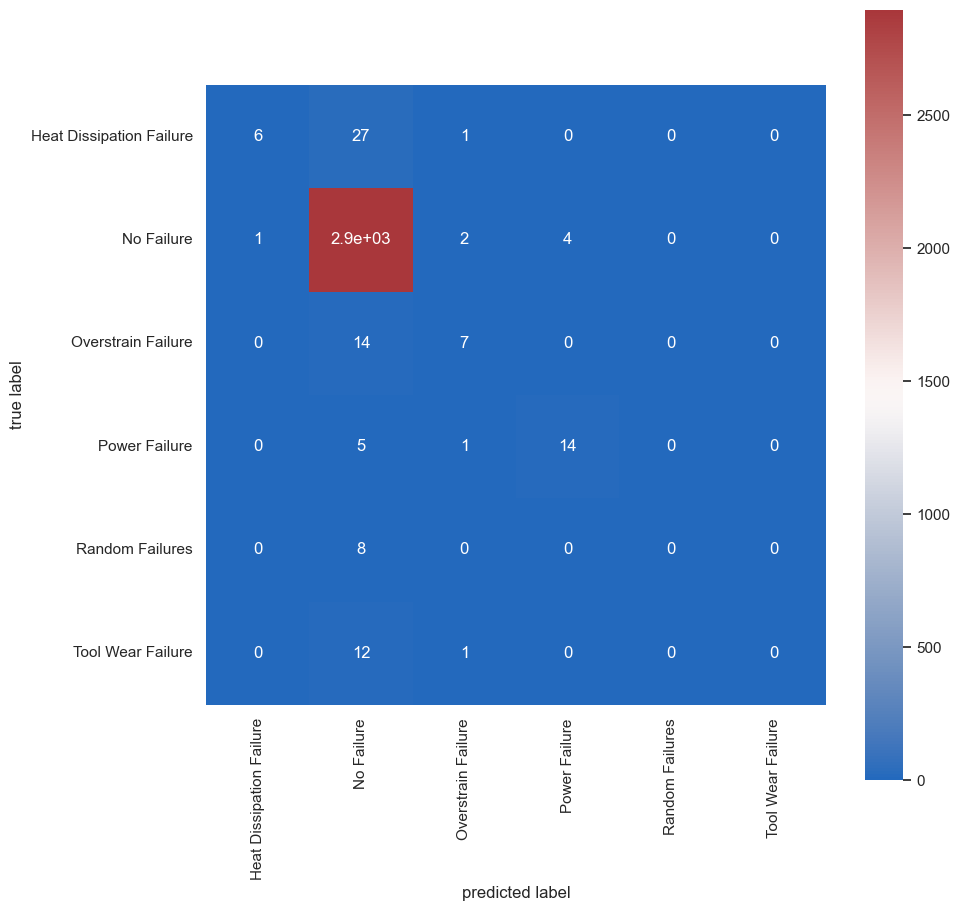

In [54]:
evaluateModel(modelRaw, x_test, y_test, encoderY)

The result is expected. The failure types are not evenly distributed, with the category "No Failure" being significantly more common than the other failure types. Since the neural networks are trained with the "sparse_categorical_accuracy" loss function, misclassifications of the few categories, such as "Random Failure" or "Overstrain Failure", do not impact the weight during training. As a result, almost all datasets are classified under the category "No Failure". The classification report shows that the unweighted F1-score (the harmonic mean of precision and recall) is 0.43, which is quite poor. The confusion matrix compares the predicted classes with the actual classes of the test data. It creates a matrix that shows how data points with actual labels (y-axis) are assigned to each predicted class. The confusion matrix confirms the F1-score (and especially the poor recall) from the report: Almost all data points are predicted as "No Failure".

Since training the neural network with unbalanced data was unsuccessful, the data processed with oversampling in Chapter [3.6.1](#361-vorhersage-des-merkmals-failure-type) will now be used. The architecture and loss function of the neural network remain unchanged.

In [55]:
#neural network with oversampled data
modelOS,early_stopping = defineModel(len(columnsX),len(set(y_trainOS)))
history = modelOS.fit(
    x_trainOS,
    y_trainOS,
    validation_data=(x_testOS, y_testOS), 
    callbacks=[early_stopping],
    epochs = 10)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 30)                210       
                                                                 
 dense_4 (Dense)             (None, 30)                930       
                                                                 
 dense_5 (Dense)             (None, 6)                 186       
                                                                 
Total params: 1,326
Trainable params: 1,326
Non-trainable params: 0
_________________________________________________________________


Epoch 1/10
1266/1266 [==============================] - 3s 2ms/step - loss: 0.4989 - sparse_categorical_accuracy: 0.8503 - val_loss: 1.2419 - val_sparse_categorical_accuracy: 0.7202
Epoch 2/10
1266/1266 [==============================] - 2s 2ms/step - loss: 0.1780 - sparse_categorical_accuracy: 0.9521 - val_loss: 1.7139 - val_sparse_categorical_accuracy: 0.7196
Epoch 3/10
1266/1266 [==============================] - 2s 2ms/step - loss: 0.1276 - sparse_categorical_accuracy: 0.9668 - val_loss: 2.2369 - val_sparse_categorical_accuracy: 0.6861
Epoch 4/10
1266/1266 [==============================] - 2s 1ms/step - loss: 0.1012 - sparse_categorical_accuracy: 0.9744 - val_loss: 2.6144 - val_sparse_categorical_accuracy: 0.6811
Epoch 5/10
1266/1266 [==============================] - 2s 2ms/step - loss: 0.0842 - sparse_categorical_accuracy: 0.9791 - val_loss: 2.9908 - val_sparse_categorical_accuracy: 0.6947
Epoch 6/10
1266/1266 [==============================] - 2s 1ms/step - loss: 0.0740 - spars

  1/545 [..............................] - ETA: 36s

545/545 [==============================] - 1s 1ms/step
                          precision    recall  f1-score   support

Heat Dissipation Failure       0.93      0.97      0.95      2904
              No Failure       0.48      0.89      0.62      2904
      Overstrain Failure       0.64      0.86      0.73      2904
           Power Failure       0.99      0.84      0.91      2904
         Random Failures       0.00      0.00      0.00      2904
       Tool Wear Failure       0.70      0.61      0.65      2904

                accuracy                           0.69     17424
               macro avg       0.62      0.69      0.64     17424
            weighted avg       0.62      0.69      0.64     17424



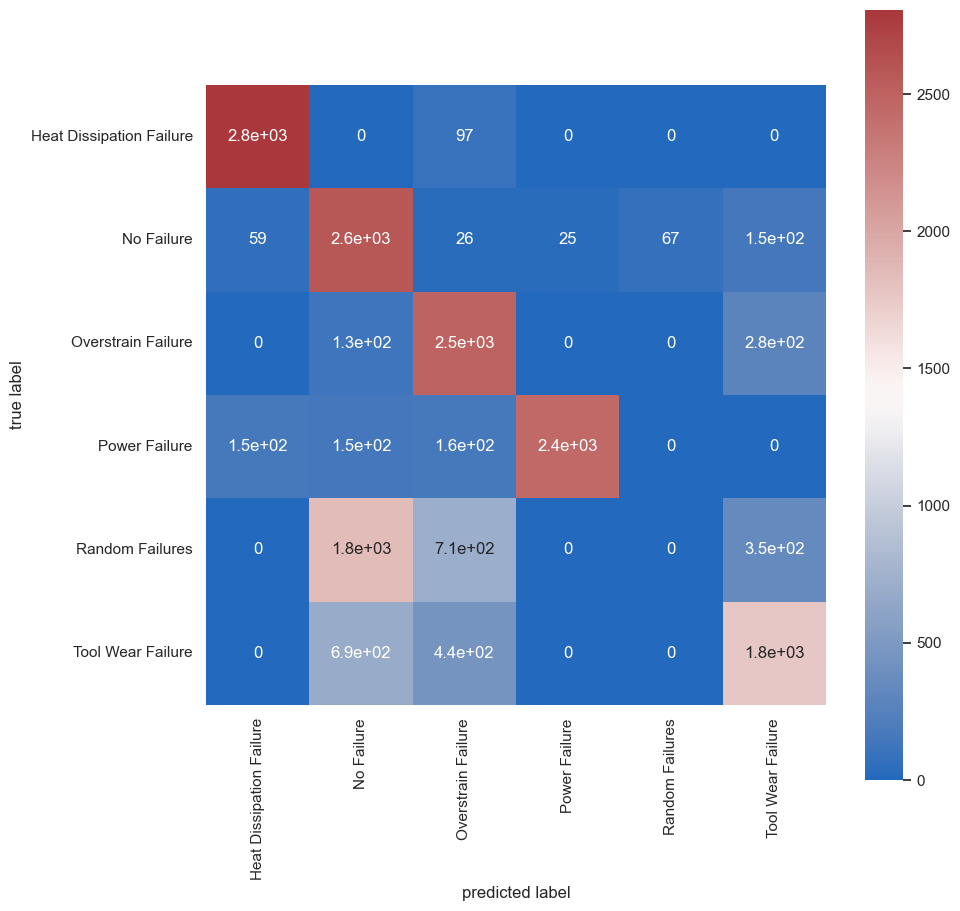

In [56]:
evaluateModel(modelOS, x_testOS, y_testOS, encoderY)

Since the failure types are no longer underrepresented, the model shows a significantly better result, with an f1-score of 0.73. However, despite this improvement, more errors are made because the test data is now equally distributed, which includes a higher proportion of difficult-to-classify failure types. As a result, the weighted f1-score is lower. Still, the neural network performs better than the previous model, especially in identifying failures (i.e., everything except "No Failure").

However, the model still makes too many errors. The f1-score for "No Failure" is only 0.58. This is mainly due to the fact that the original dataset, with only 10,000 samples, is very small. There is simply too little information about the machine's failure types. Oversampling only duplicates the data, thereby not increasing the informational content. For example, nearly 3,000 "Random Failure" data points are generated based on fewer than 10 original samples.

Additionally, compared to other methods, there is a clear indication of overfitting. The "val_sparse_categorical_accuracy" value (referring to the test data) worsens during training, indicating that the neural network is becoming more adjusted to the training data, thus making it less accurate for test data. This issue is likely caused by the significant difference between the training and test datasets, once again pointing to the small number of data points as the root cause.

Since there are very few distinct data points for the failure types (everything except "No Failure"), in chapter [3.6.1](#361-vorhersage-des-merkmals-failure-type), new datasets are generated using the SMOTE algorithm. These generated datasets are not exact copies, but rather synthetic examples that provide more variance and information. The SMOTE algorithm creates new samples by drawing a line between two data points of the same class in the feature space and randomly generating new data points along this line. This approach helps to mitigate the imbalance in the data and increase the diversity of the training set, thereby improving the model's ability to generalize.

In [57]:
#neural network with SMOTE data
modelSMOTE,early_stopping = defineModel(len(columnsX),len(set(y_trainSMOTE)))
history = modelSMOTE.fit(
    x_trainSMOTE,
    y_trainSMOTE,
    validation_data=(x_testSMOTE, y_testSMOTE), 
    callbacks=[early_stopping],
    epochs = 3)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 30)                210       
                                                                 
 dense_7 (Dense)             (None, 30)                930       
                                                                 
 dense_8 (Dense)             (None, 6)                 186       
                                                                 
Total params: 1,326
Trainable params: 1,326
Non-trainable params: 0
_________________________________________________________________


Epoch 1/3
1266/1266 [==============================] - 3s 2ms/step - loss: 0.4476 - sparse_categorical_accuracy: 0.8698 - val_loss: 0.6741 - val_sparse_categorical_accuracy: 0.7919
Epoch 2/3
1266/1266 [==============================] - 2s 2ms/step - loss: 0.1679 - sparse_categorical_accuracy: 0.9524 - val_loss: 0.9239 - val_sparse_categorical_accuracy: 0.7994
Epoch 3/3
1266/1266 [==============================] - 2s 2ms/step - loss: 0.1312 - sparse_categorical_accuracy: 0.9633 - val_loss: 1.1826 - val_sparse_categorical_accuracy: 0.7973


545/545 [==============================] - 1s 806us/step
                          precision    recall  f1-score   support

Heat Dissipation Failure       0.98      1.00      0.99      2904
              No Failure       0.59      0.81      0.69      2904
      Overstrain Failure       0.82      0.90      0.86      2904
           Power Failure       0.91      1.00      0.95      2904
         Random Failures       0.72      0.20      0.31      2904
       Tool Wear Failure       0.76      0.88      0.82      2904

                accuracy                           0.80     17424
               macro avg       0.80      0.80      0.77     17424
            weighted avg       0.80      0.80      0.77     17424



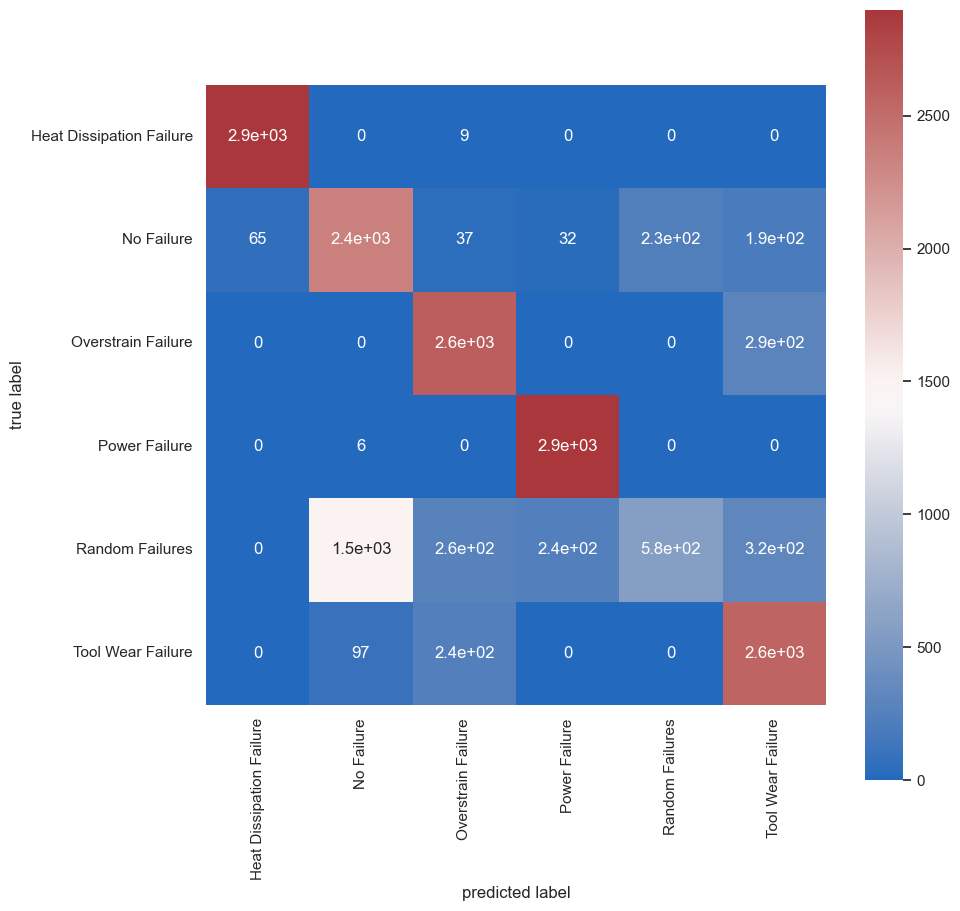

In [58]:
evaluateModel(modelSMOTE, x_testSMOTE, y_testSMOTE, encoderY)

It is evident that this neural network performs the best. The data generated using SMOTE are less prone to overfitting. Nevertheless, training is stopped early to prevent drift between the training and test accuracy. As a result, an F1-score of 0.90 is achieved. Furthermore, several different neural networks were used, and the architecture employed here produces one of the best results. However, the results vary significantly when rerunning the code. This variance is primarily due to the small dataset of failure types and the subsequent splitting of the data into training and test sets using the train-test split. 

### 4.1.2 Identifizieren des Merkmals "Target"

For a neural network with somewhat more general predictions, only the feature "Target" is classified. The neural network should predict whether it is a failure or not. Since, in the previous networks, the failure types could sometimes not be distinguished from each other, it will be investigated whether a more general prediction performs better. The selection of features and the treatment of unbalanced data are carried out in chapter [3.6.2](#362-predicting-the-feature-target). Since the SMOTE algorithm has already been identified as the best choice, the following data has been balanced using SMOTE.

In [59]:
#neural network with SMOTE data
modelTarget,early_stopping = defineModel(len(columnsXT),len(set(y_trainT)))
history = modelTarget.fit(
    x_trainT,
    y_trainT,
    validation_data=(x_testT, y_testT), 
    callbacks=[early_stopping],
    epochs = 20)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 30)                210       
                                                                 
 dense_10 (Dense)            (None, 30)                930       
                                                                 
 dense_11 (Dense)            (None, 2)                 62        
                                                                 
Total params: 1,202
Trainable params: 1,202
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20


422/422 [==============================] - 1s 2ms/step - loss: 0.3842 - sparse_categorical_accuracy: 0.8302 - val_loss: 0.2768 - val_sparse_categorical_accuracy: 0.8878
Epoch 2/20
422/422 [==============================] - 1s 2ms/step - loss: 0.2423 - sparse_categorical_accuracy: 0.9024 - val_loss: 0.2666 - val_sparse_categorical_accuracy: 0.8897
Epoch 3/20
422/422 [==============================] - 1s 2ms/step - loss: 0.2094 - sparse_categorical_accuracy: 0.9165 - val_loss: 0.2255 - val_sparse_categorical_accuracy: 0.9064
Epoch 4/20
422/422 [==============================] - 1s 2ms/step - loss: 0.1878 - sparse_categorical_accuracy: 0.9305 - val_loss: 0.2235 - val_sparse_categorical_accuracy: 0.9101
Epoch 5/20
422/422 [==============================] - 1s 2ms/step - loss: 0.1723 - sparse_categorical_accuracy: 0.9340 - val_loss: 0.2049 - val_sparse_categorical_accuracy: 0.9148
Epoch 6/20
422/422 [==============================] - 1s 2ms/step - loss: 0.1607 - sparse_categorical_accuracy:

182/182 [==============================] - 1s 1ms/step
              precision    recall  f1-score   support

           0       0.89      0.94      0.92      2910
           1       0.94      0.89      0.91      2910

    accuracy                           0.92      5820
   macro avg       0.92      0.92      0.92      5820
weighted avg       0.92      0.92      0.92      5820



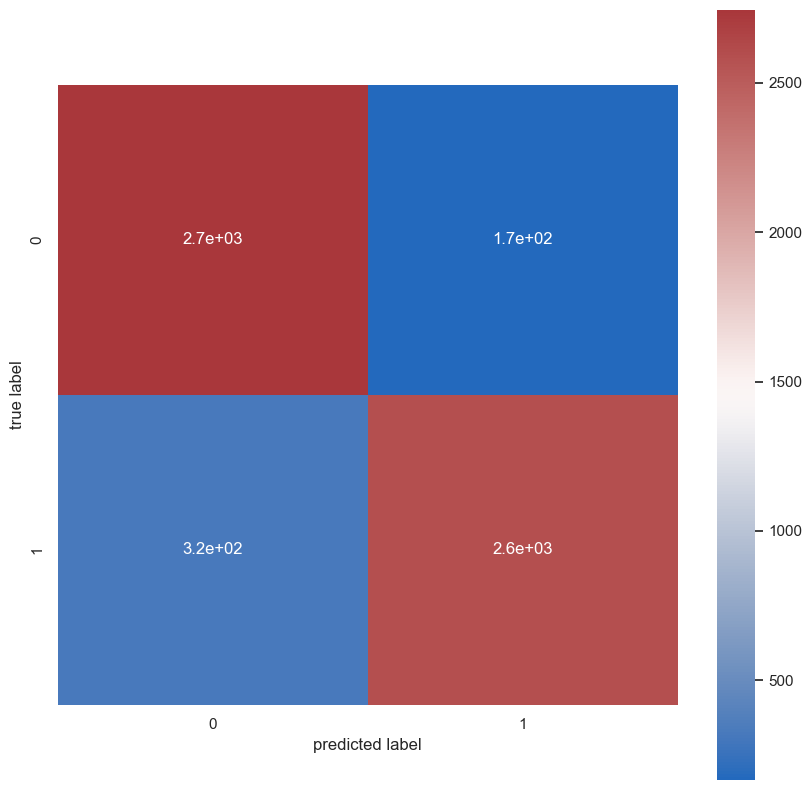

In [60]:
evaluateModel(modelTarget, x_testT, y_testT, encoderYT)

The f1-score is 0.95, which is even better. The classification between the errors seems to be difficult, which is why a better f1-score can be achieved here.

### 4.1.3 Vorhersage des Merkmals "Tool Wear"

The feature "Tool Wear [min]" represents the usage duration of the currently used tool in minutes. It is a clear indicator for "Tool wear failure" and can therefore be helpful for predictive maintenance of the machine. In contrast to the features "Target" and "Failure Type," this is a continuous feature. Therefore, the network architecture and error function need to be adjusted. The output layer of the neural network now consists of only one neuron, which predicts the usage duration. The error function used is the mean squared error between the predicted and actual values. The preprocessed data from Chapter [3.6.3](#363-vorhersage-des-merkmals-tool-wear) will be used.

In [61]:
#neural network with SMOTE data
modelTW,early_stopping = defineRegressionModel(len(columnsXTW),1)
history = modelTW.fit(
    x_trainTW,
    y_trainTW,
    validation_data=(x_testTW, y_testTW), 
    epochs = 20)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 20)                120       
                                                                 
 dense_13 (Dense)            (None, 20)                420       
                                                                 
 dense_14 (Dense)            (None, 1)                 21        
                                                                 
Total params: 561
Trainable params: 561
Non-trainable params: 0
_________________________________________________________________


Epoch 1/20
219/219 [==============================] - 1s 3ms/step - loss: 1.0770 - mean_absolute_error: 0.8885 - mean_squared_error: 1.0765 - val_loss: 1.0084 - val_mean_absolute_error: 0.8627 - val_mean_squared_error: 1.0082
Epoch 2/20
219/219 [==============================] - 0s 2ms/step - loss: 1.0057 - mean_absolute_error: 0.8680 - mean_squared_error: 1.0060 - val_loss: 1.0040 - val_mean_absolute_error: 0.8607 - val_mean_squared_error: 1.0038
Epoch 3/20
219/219 [==============================] - 0s 2ms/step - loss: 1.0035 - mean_absolute_error: 0.8671 - mean_squared_error: 1.0032 - val_loss: 1.0121 - val_mean_absolute_error: 0.8633 - val_mean_squared_error: 1.0121
Epoch 4/20
219/219 [==============================] - 0s 2ms/step - loss: 1.0023 - mean_absolute_error: 0.8669 - mean_squared_error: 1.0023 - val_loss: 1.0129 - val_mean_absolute_error: 0.8636 - val_mean_squared_error: 1.0129
Epoch 5/20
219/219 [==============================] - 0s 2ms/step - loss: 1.0024 - mean_absolute

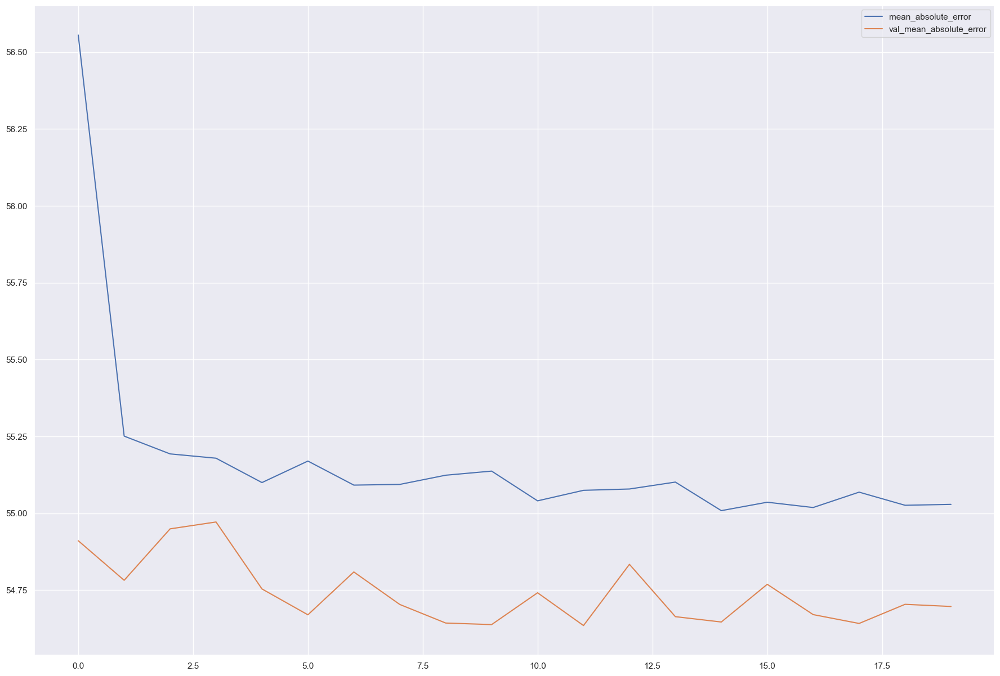

In [62]:
history_df = pd.DataFrame(history.history)
# inverse transform
history_df = history_df * np.sqrt(standardScaler.var_[-1])
plot = history_df.loc[:,['mean_absolute_error','val_mean_absolute_error']].plot()
fig = plot.get_figure()

The neural network has a mean absolute deviation of about 55 minutes for the training data. To better assess this deviation, a "random predictor" is implemented. This predictor uses a random value between zero and the maximum usage duration to predict the tool's usage time. When applied to the same test data, the "random predictor" produces a mean absolute deviation of approximately 80 minutes. Therefore, the neural network's prediction is only 25 minutes better than the random selection of a value. The neural network is thus not well-suited for determining the current usage duration.

For predicting the remaining usage duration until the tool needs to be replaced, the difference between the current usage time and the failure time would need to be determined. However, this approach is abandoned because the failure time is almost always around 250 minutes, resulting in no difference compared to the current neural network. Therefore, no good model is expected. Recurrent networks like LSTM (Long Short-Term Memory) are much better suited for time series. However, the original data set contains too few data points and has too low a sampling rate for this approach.

In [63]:
import random
y_predTW = modelTW.predict(x_testTW)
y_testTWformed = list(y_testTW)
# inverse transform
for index, i in enumerate(y_testTWformed):
    y_testTWformed[index] = int(y_testTWformed[index] * np.sqrt(standardScaler.var_[-1]) + standardScaler.mean_[-1])
y_predRandomAbsError = []
maxRandom = max(y_testTWformed)
for index,val in enumerate(y_predTW):
    #print(y_predTW[index],"---",y_testTWformed[index])
    y_predRandomAbsError.append(abs(y_testTWformed[index]-random.randint(0,maxRandom)))
#evaluateModel(modelTW, x_testTW, y_testTW)
print("mean absolute error of random predictor:",sum(y_predRandomAbsError)/len(y_predRandomAbsError))
#compare it to random predictor

 1/94 [..............................] - ETA: 5s

94/94 [==============================] - 0s 1ms/step
mean absolute error of random predictor: 79.06033333333333


## 4.2 Training eines Entscheidungsbaumes zur Anomalieerkennung

In [64]:
from sklearn import tree, metrics
from sklearn.preprocessing import OneHotEncoder

                          precision    recall  f1-score   support

Heat Dissipation Failure       0.79      0.85      0.82      2904
              No Failure       0.53      0.79      0.64      2904
      Overstrain Failure       0.78      0.86      0.82      2904
           Power Failure       0.91      0.87      0.89      2904
         Random Failures       0.48      0.11      0.17      2904
       Tool Wear Failure       0.78      0.91      0.84      2904

                accuracy                           0.73     17424
               macro avg       0.71      0.73      0.70     17424
            weighted avg       0.71      0.73      0.70     17424



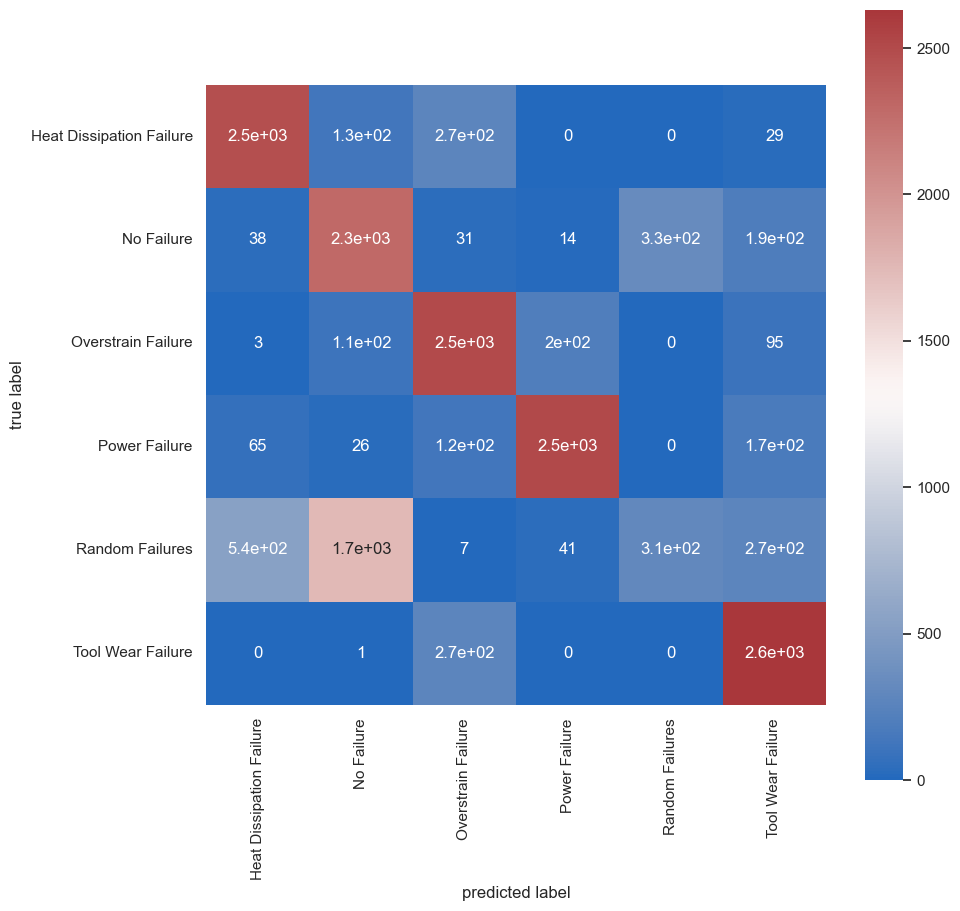

In [65]:
DTR = tree.DecisionTreeClassifier(min_impurity_decrease=0.001)
DTR.fit(x_trainSMOTE,y_trainSMOTE)

y_predDT = DTR.predict(x_testSMOTE)
y_test_transformDT = encoderY.inverse_transform(y_testSMOTE)
y_pred_transformDT = encoderY.inverse_transform(y_predDT)

#classfication report
report = classification_report(y_test_transformDT, y_pred_transformDT)
print(report)

sortedLabels = sorted(set(y_test_transformDT))
ax = plt.figure(figsize=(10,10))
ax = sb.heatmap(confusion_matrix(y_test_transformDT,y_pred_transformDT),square=True,annot=True,cmap="vlag",xticklabels=sortedLabels, yticklabels=sortedLabels)
ax.set(xlabel='predicted label', ylabel='true label')
plt.show()

[Text(0.4732142857142857, 0.9, 'Tool wear [min] <= 1.273\ngini = 0.833\nsamples = 40488\nvalue = [6748, 6748, 6748, 6748, 6748, 6748]'),
 Text(0.23214285714285715, 0.7, 'Rotational speed [rpm] <= -0.897\ngini = 0.753\nsamples = 25322\nvalue = [6202, 5968, 181, 6223, 6748, 0]'),
 Text(0.14285714285714285, 0.5, 'Torque [Nm] <= 2.329\ngini = 0.551\nsamples = 10497\nvalue = [6196, 714, 181, 3234, 172, 0]'),
 Text(0.07142857142857142, 0.3, 'Air temperature [K] <= 0.748\ngini = 0.251\nsamples = 7094\nvalue = [6095, 690, 120, 17, 172, 0]'),
 Text(0.03571428571428571, 0.1, '\n  (...)  \n'),
 Text(0.10714285714285714, 0.1, '\n  (...)  \n'),
 Text(0.21428571428571427, 0.3, 'Tool wear [min] <= 1.199\ngini = 0.105\nsamples = 3403\nvalue = [101, 24, 61, 3217, 0, 0]'),
 Text(0.17857142857142858, 0.1, '\n  (...)  \n'),
 Text(0.25, 0.1, '\n  (...)  \n'),
 Text(0.32142857142857145, 0.5, 'Torque [Nm] <= -2.466\ngini = 0.637\nsamples = 14825\nvalue = [6, 5254, 0, 2989, 6576, 0]'),
 Text(0.285714285714285

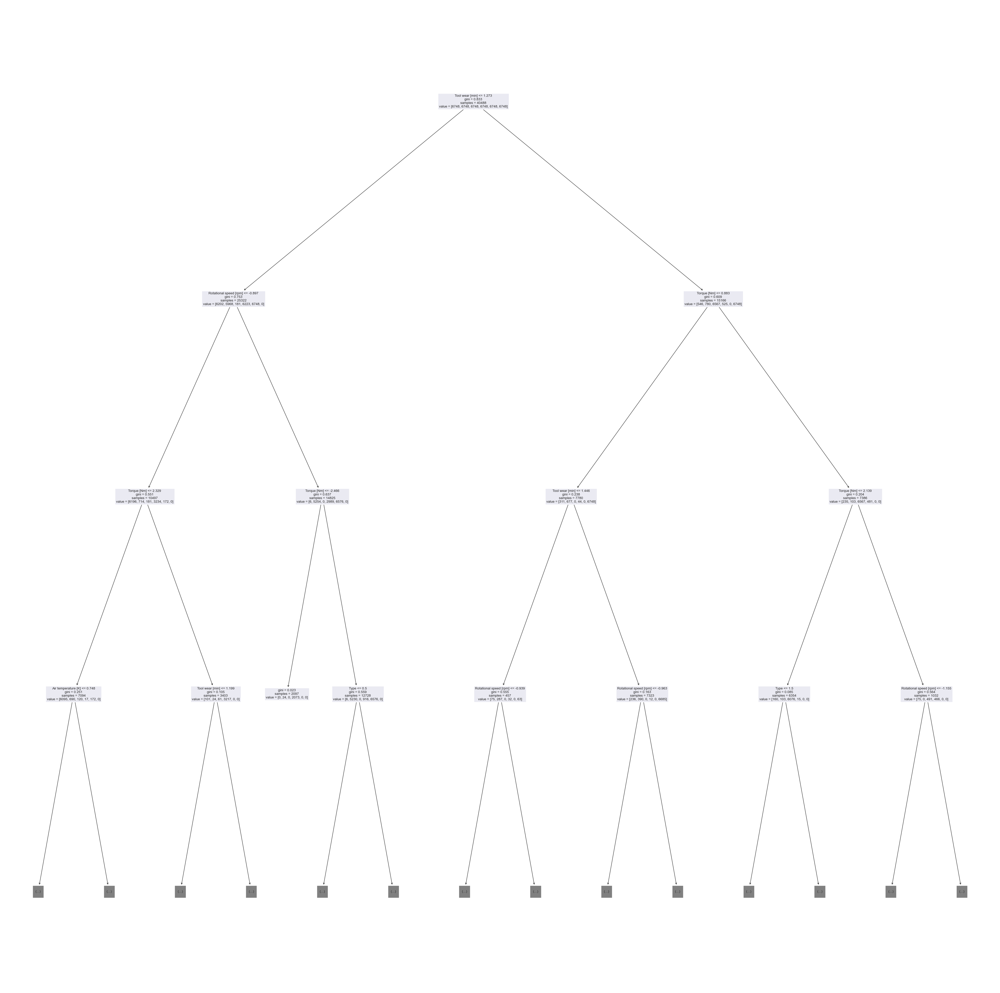

In [77]:
plt.figure(figsize=(50,50))  # set plot size (denoted in inches)
tree.plot_tree(DTR,feature_names=columnsX, max_depth=3)

A decision tree can also generally achieve good results. However, it again becomes apparent that "Random Failure" is not distinguishable from "No Failure." The quality of the result is highly dependent on the train-test split. If the "Random Failure" datasets were removed, an f1-score of 0.90 could certainly be achieved.

For predicting the faults, there is a general problem: there are too few datasets and therefore too little information for the models to make accurate predictions. The methods for "imbalanced data treatment" cannot create new information. With such a low density of datasets, the train-test split nearly creates two entirely separate groups of datasets. Since SMOTE generates similar datasets within these groups, the groups become further separated. With only 20 datasets, chance is not on our side. The probability of a split is high, and thus the data is not representative. Applying SMOTE before the split would result in nearly identical data in both the test and training sets, which cannot be done. The same problem applies to classic oversampling. The exact copies create two completely different datasets for the same fault type in the training and test sets. However, by selecting an appropriate network architecture, applying imbalanced data treatment, and standardizing the data, a satisfactory result can still be achieved.

## 4.3 Predictive Maintenance

Predictive Maintenance is thematically linked to the previous anomaly detection. In addition to pure anomaly detection, this chapter aims to detect the premature failure of the system based on the trend of a Condition Indicator. In chapter [4.3.1](#431-neural-networks), previously trained networks are reused for this purpose (including RUL calculation). A second approach involves training Self-Organizing Maps in chapter [4.3.2](#432-som) and subsequently using them for Predictive Maintenance in chapter [4.3.3](#433-som-predictive-maintenance). Finally, chapter [4.3.4](#434-pca) and [4.3.5](#435-pca-predictive-maintenance) introduce Principal Component Analysis for Predictive Maintenance.

### 4.3.1 Neuronale Netze

In subchapter [4.1](#41-training-a-neural-network-for-anomaly-detection), neural networks are already trained to predict the type of error (Failure Type) or anomaly. The output or prediction of the neural networks, however, is not discrete or binary. Instead, the "Softmax function" in the final layer of the neural network transforms the outputs into a form of probability. For example, in the prediction of the "Failure Type," the neural network contains an output neuron for each failure type, modeling the probability of that failure type. The failure type prediction is then made by selecting the type with the highest probability.

The following approach consists of using the neural network not only for anomaly detection but also to perform Predictive Maintenance based on the probabilities of the output neurons. The goal is to investigate to what extent a trend in the probability of failure types can be detected.

In [78]:
predictions = modelTarget.predict(x_T)
y_pred_prob = []
for i in predictions:
    y_pred_prob.append(np.array(i))
df_Target_prob = pd.DataFrame(y_pred_prob, columns=['no failure','failure'])
df_Target_prob['real value'] = yLabelT
df_Target_prob['Tool wear [min]'] = x_testT['Tool wear [min]']

df_Target_prob.head()

  1/313 [..............................] - ETA: 5s

313/313 [==============================] - 0s 1ms/step


,no failure,failure,real value,Tool wear [min]
0,0.999991,0.000009,0,0.079323
1,0.999926,0.000074,0,1.367599
2,0.999696,0.000304,0,1.179071
3,0.999993,0.000007,0,-0.376287
4,0.999993,0.000007,0,1.666102


All data is predicted again using the neural network. This time, the probability of a failure or no failure is stored. To maintain the original temporal progression of the data, all data is used. This contradicts the approach where training and test data must be strictly separated. However, the goal here is not to evaluate the neural network, but to investigate the possibility of Predictive Maintenance. To visualize the wear and tear of the data over time, a random "train_test_split" cannot be applied.

<Axes: xlabel='Tool wear [min]', ylabel='failure'>

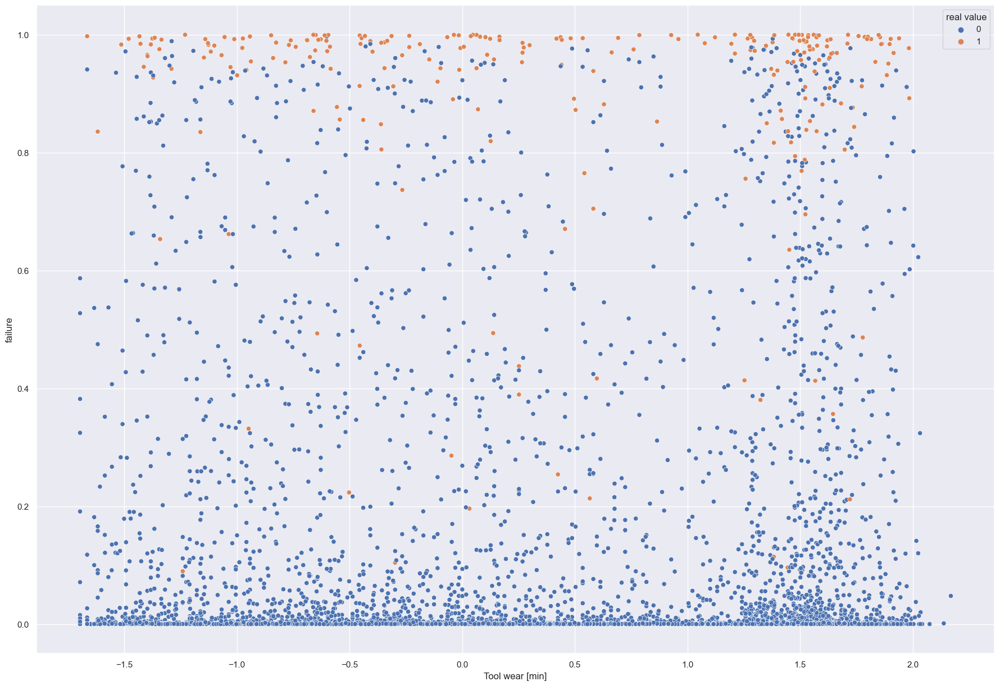

In [79]:
sb.scatterplot(data=df_Target_prob,x='Tool wear [min]',y='failure',hue='real value')

The figure visualizes the relationship between tool usage duration and the predicted probability. The color coding indicates whether it is actually a failure. This is also evident when only test data is visualized. It can generally be observed that a high usage duration increases the probability of a failure occurring.

<Axes: ylabel='failure'>

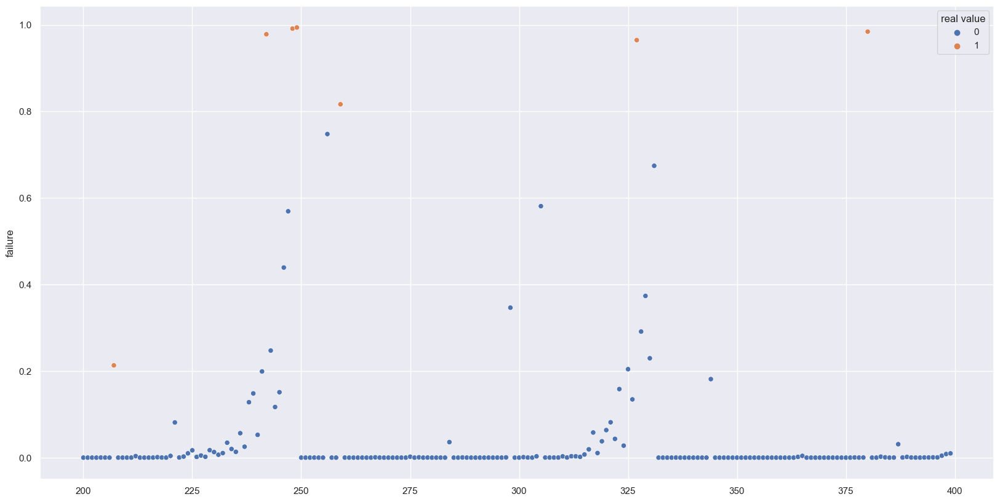

In [80]:
plt.figure(figsize=(20, 10))
sb.scatterplot(data=df_Target_prob[200:400],x=df_Target_prob.index[200:400],y='failure',hue='real value')

Using 200 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/200 [00:00<?, ?it/s]

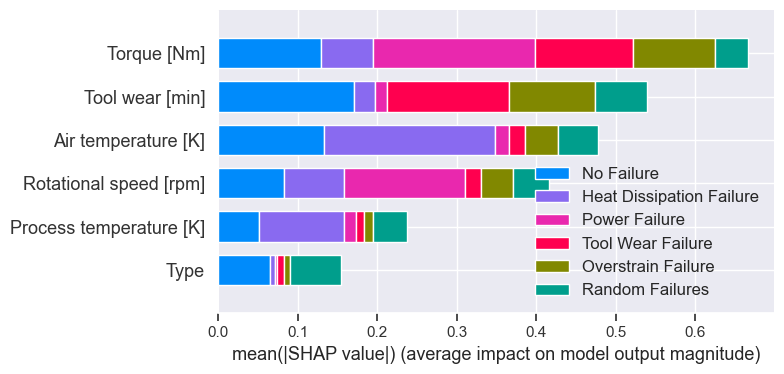

In [110]:
import shap
samples = shap.sample(x_trainSMOTE, 200)
explainer = shap.KernelExplainer(modelSMOTE, samples)
shap_values = explainer.shap_values(samples, nsamples=200)
shap.summary_plot(shap_values,feature_names=columnsX,class_names=sortedLabels)

The figure shows a subset of the data. The x-axis represents the index of the data points, corresponding to the original chronological sequence. The y-axis represents the predicted probability of a failure. Actual failures are marked in orange. Before most actual failures, an increase in the failure probability can be observed. Therefore, the failure probability serves as a "condition indicator." However, significant jumps in the trend are also noticeable, which could lead to maintenance being carried out too early. A moving average could potentially improve the prediction, preventing individual outliers from triggering maintenance or plant shutdown prematurely.

The following implements an initial approach for calculating the Remaining Useful Life (RUL). This is based on the "Similarity Model," as data from the complete history is available (including observed failures). The predicted failure probability from the neural network continues to serve as the condition indicator. The distance measure used to calculate the similarity between two time series is the Euclidean distance, with additional temporal weighting. A time series includes all data points up to the reset of the tool wear. Once the most similar time series is identified, the point at which the failure probability first exceeds the threshold is checked. This is just an initial approach, as inconsistencies, such as those explained in Chapter [2](#2-data-understanding) (e.g., tool wear resets without a prior tool wear failure), are not accounted for.

In [ ]:
df_Target_prob['Tool wear [min]'].head(100)
df_Target_prob['real Tool wear [min]'] = df_Target_prob['Tool wear [min]'] * np.sqrt(standardScaler.var_[-1]) + standardScaler.mean_[-1]

#split data into time series
rows_per_cycle = []
one_cycle = []
for row in df_Target_prob.iterrows():
    if row[1]['real Tool wear [min]'] == 0.0 and row[0] != 0:
        rows_per_cycle.append(one_cycle)
        one_cycle = []
    one_cycle.append(row[1]['failure'])
rows_per_cycle.append(one_cycle)

#train test split
rows_per_cycle_train = rows_per_cycle[:100]
rows_per_cycle_test = rows_per_cycle[100:]

#similarity between two time series with euclidean distance and time weighting
def distance(ts1,ts2):
    if len(ts1) > len(ts2):
        return np.Inf
    sum = 0
    for i in range(0,len(ts1)):
        sum = sum + (ts1[i]-ts2[i])*(ts1[i]-ts2[i])*(1+i/10)
    return np.sqrt(sum)


#search for most similar time series and return predicted RUL
def similarity_model(ts,expert_threshold=0.9):
    dist = []
    for ts_train in rows_per_cycle_train:
        dist.append(distance(ts,ts_train))
    
    bestFit = rows_per_cycle_train[np.argmin(np.array(dist))]
    start_index = len(ts)
    if start_index > len(bestFit):
            raise TypeError("no valid time series [input length]")
    for i in range(start_index,len(bestFit)):
        if bestFit[i] > expert_threshold:
            return i-start_index
    raise TypeError("no failure was predicted [threshold too high]")

def printRUL(index_test_time_series,startingPoint):
    try:
        print("predicted RUL in amount of workpieces:",similarity_model(rows_per_cycle_test[index_test_time_series][:startingPoint]))
        print("real RUL:",len(rows_per_cycle_test[index_test_time_series])-startingPoint)
    except:
        print("cannot predict RUL for index ",index_test_time_series)
    

In [ ]:
for i in range(0,len(rows_per_cycle_test)):
    printRUL(i,40)
    print("-----------------------------------")


predicted RUL in amount of workpieces: 32
real RUL: 42
-----------------------------------
cannot predict RUL for index  1
-----------------------------------
predicted RUL in amount of workpieces: 42
real RUL: 41
-----------------------------------
cannot predict RUL for index  3
-----------------------------------
predicted RUL in amount of workpieces: 42
real RUL: 35
-----------------------------------
predicted RUL in amount of workpieces: 45
real RUL: 43
-----------------------------------
cannot predict RUL for index  6
-----------------------------------
predicted RUL in amount of workpieces: 2
real RUL: 39
-----------------------------------
cannot predict RUL for index  8
-----------------------------------
cannot predict RUL for index  9
-----------------------------------
predicted RUL in amount of workpieces: 3
real RUL: 42
-----------------------------------
cannot predict RUL for index  11
-----------------------------------
predicted RUL in amount of workpieces: 34
real 

The implementation shows that the calculated RUL already provides very good results in some cases. For consistently low deviations between the actual and predicted RUL, an optimization of the data base (using only tool wear failures) and the distance measure would be necessary.

### 4.3.2 SOM

Self-Organizing Maps (SOM) are a type of neural networks. SOMs reduce the dimensionality of the input space onto a map. This enables a two-dimensional discretized representation of high-dimensional data. The number of input neurons corresponds to the number of dimensions in the data. The weights of the output neurons correspond to the coordinates of the neurons in space. Through training, these neurons are adjusted to the training data in space. The "Best Matching Unit" is the neuron that exhibits the smallest distance to the presented data point.

In the following, the Python module "minisom" will be used to design, train, and visualize SOMs.

In [45]:
#pip install minisom
from minisom import MiniSom
import math
from matplotlib import pyplot as plt

A Self-Organizing Map (SOM) will be trained with a square pattern of output neurons. The neighborhood radius and the number of neurons will be adjusted according to the "Best Practice" recommendations from the lecture. The training datasets will exclusively include the continuous features. Since the model is not trained based on the predicted features "Target" and "Failure Type," the remaining features are Air temperature [K], Process temperature [K], Rotational speed [rpm], Torque [Nm], and Tool wear [min]. Additionally, the features will be standardized as outlined in the [Data Preparation](#3-data-preparation) chapter.

In [120]:
#dfTrainSOM = pd.concat([x_trainSMOTE,x_testSMOTE])
#df_ySOM = pd.DataFrame(encoderY.inverse_transform(list(y_trainSMOTE) + list(y_testSMOTE)),columns=["Failure Type"])

numNodes = 5*math.sqrt(len(df)) #Best Practice for the number of neurons for the map
#design a sqaured map
#sigma is Best Practice
som = MiniSom(math.floor(math.sqrt(numNodes)), math.floor(math.sqrt(numNodes)),5,sigma=10.0,learning_rate=5,neighborhood_function='gaussian')
#print(som.init_weights)
som.train_random(np.array(df_stand.iloc[:,1:6]),30000) #train the SOM with 30000 iterations

c:\Users\Jona\Documents\FH\5-Semester\Diagnose_und_PM\Projektarbeit\PM_Semester-5\venv\lib\site-packages\numpy\linalg\linalg.py:2557: RuntimeWarning: overflow encountered in reduce
  return sqrt(add.reduce(s, axis=axis, keepdims=keepdims))
c:\Users\Jona\Documents\FH\5-Semester\Diagnose_und_PM\Projektarbeit\PM_Semester-5\venv\lib\site-packages\numpy\linalg\linalg.py:2556: RuntimeWarning: overflow encountered in multiply
  s = (x.conj() * x).real


The previously trained Self-Organizing Map (SOM) is visualized below. All the datasets of the SOM are presented again, with each dataset being assigned to its Best Matching Unit (BMU). Each square in the figure represents a neuron. Every dataset assigned to that neuron is represented by a point. The color of the point corresponds to the Failure Type of the dataset. To avoid overlapping points from the same neuron, the coordinates of the points are slightly offset randomly. 

In addition to the color coding of the data points, the neurons themselves are marked in black for 0.0 up to white for 1.0. This corresponds to the information in the so-called "u-matrix." The "u-matrix" (using the `distance_map` method in minisom) calculates the distance between each neuron and its neighboring neurons. Thus, lighter neurons represent those that are far apart from other neurons, indicating that they represent highly distinct data points.

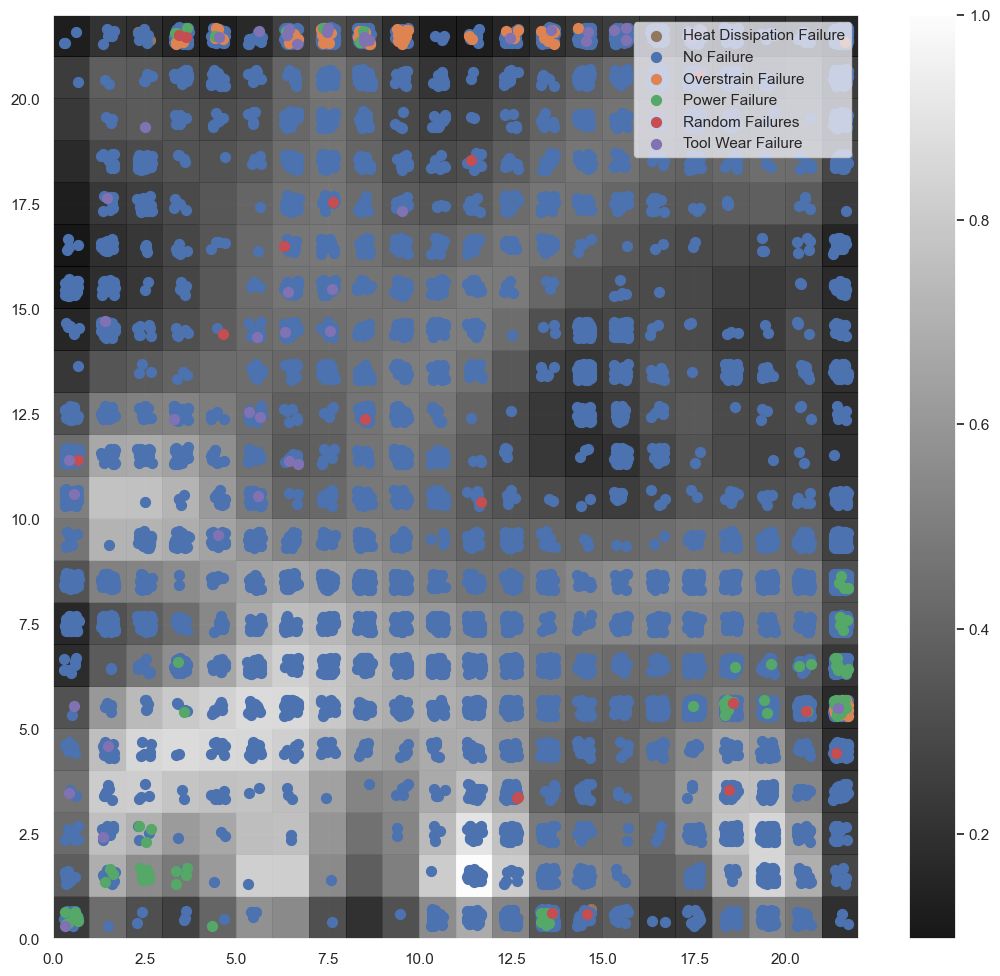

In [121]:
w_x, w_y = zip(*[som.winner(d) for d in np.array(df_stand.iloc[:,1:6])])
w_x = np.array(w_x)
w_y = np.array(w_y)
colors = ['C0', 'C1', 'C2','C3','C4','C5']
plt.figure(figsize=(13, 12))
plt.pcolor(som.distance_map().T, cmap='gray', alpha=0.9)
plt.colorbar()

for index,c in enumerate(np.unique(df['Failure Type'])):
    idx_target = df['Failure Type']==c
    plt.scatter(w_x[idx_target]+.5+(np.random.rand(np.sum(idx_target))-.5)*.4,
                w_y[idx_target]+.5+(np.random.rand(np.sum(idx_target))-.5)*.4, 
                s=50, c=colors[index-1], label=c)
plt.legend(loc='upper right')
plt.grid()
#plt.savefig('resulting_images/som_seed.png')
plt.show()

The visualization clearly demonstrates that a large portion of the failure types (when they occur) can be differentiated from each other. For instance, clusters of Power or Overstrain failures are formed. The "Random Failure" appears to be truly random, as it is spread throughout the entire map. However, distinguishing failure types from non-failure data points remains difficult. Almost all neurons contain "No Failure" data points, highlighting the challenge in predicting or clearly identifying the existing failures. No improvement was achieved by using SMOTE to balance the data.

The quantization error describes the distance between a data point and its Best Matching Unit (BMU). The following figure visualizes the quantization error for each dataset of the previously trained SOM.

In [63]:
quantErr = []
for index,observation in enumerate(np.array(df_stand.iloc[:,1:6])):
    quantErr.append(som.quantization_error([observation]))
    #print(observation)

dfSOM = df
dfSOM["quantization_error"] = quantErr
dfSOM

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type,quantization_error
0,M,298.1,308.6,1551,42.8,0,0,No Failure,1.082547
1,L,298.2,308.7,1408,46.3,3,0,No Failure,1.249226
2,L,298.1,308.5,1498,49.4,5,0,No Failure,1.362764
3,L,298.2,308.6,1433,39.5,7,0,No Failure,0.993693
4,L,298.2,308.7,1408,40.0,9,0,No Failure,1.028873
...,...,...,...,...,...,...,...,...,...
9995,M,298.8,308.4,1604,29.5,14,0,No Failure,0.976758
9996,H,298.9,308.4,1632,31.8,17,0,No Failure,0.890582
9997,M,299.0,308.6,1645,33.4,22,0,No Failure,0.833114
9998,H,299.0,308.7,1408,48.5,25,0,No Failure,1.098874


The current Self-Organizing Map (SOM) is trained with all available data. However, for correct anomaly detection, this SOM does not make much sense. The quantization error simply indicates that the winning neuron still has a large distance from the input data. Nevertheless, the SOM has been trained on the errors, meaning that some neurons represent error types (even though it is clear that clean training with "normal data" is not possible). Therefore, the quantization error cannot be used to predict anomalies.

A method for calculating the quantization error is described in the book *"IMPROVE – Innovative Modelling Approaches for Production Systems to Raise Validatable Efficiency"*. In this work, SOMs are trained using normal data from a system to discretize continuous data. This allows the discrete "valleys" in the neurons to be mapped to states, which can later be used for OTALA or BUTLA. Although the data in this analysis does not exhibit typical process behavior, the solution approach for the SOM should still be adopted.

Thus, the following steps will involve training a SOM with a subset of normal data (no failures) and then calculating the quantization error with error types and previously unseen normal data. A high quantization error will then identify a dataset that deviates from the normal behavior.

In [56]:
#Die vorherige breschriebende Idee wird hier ausprobiert
#data preprocessing

df_stand2 = df_stand.iloc[:,1:6]
df_stand2['Failure Type'] = df['Failure Type']
df_stand_normal = df_stand2[df_stand2['Failure Type']=='No Failure']
df_stand_error = df_stand2[df_stand2['Failure Type']!='No Failure']
df_stand_normalS = df_stand_normal.sample(frac=1)
df_stand_normal_train = df_stand_normalS.head(math.floor(len(df_stand_normalS.index)*0.75))   #get random 75% of normal plant behaviour from data for training
df_stand_normal_test = df_stand_normalS.tail(math.floor(len(df_stand_normalS.index)*0.25))   #get random 25% of normal plant behaviour from data for testing
df_stand_test = pd.concat([df_stand_error,df_stand_normal_test])
df_stand_test.reset_index(drop=True, inplace=True)
columnsToTrain = [i for i in df_stand_normal.columns if i != 'Failure Type']


<AxesSubplot: ylabel='quantization_error'>

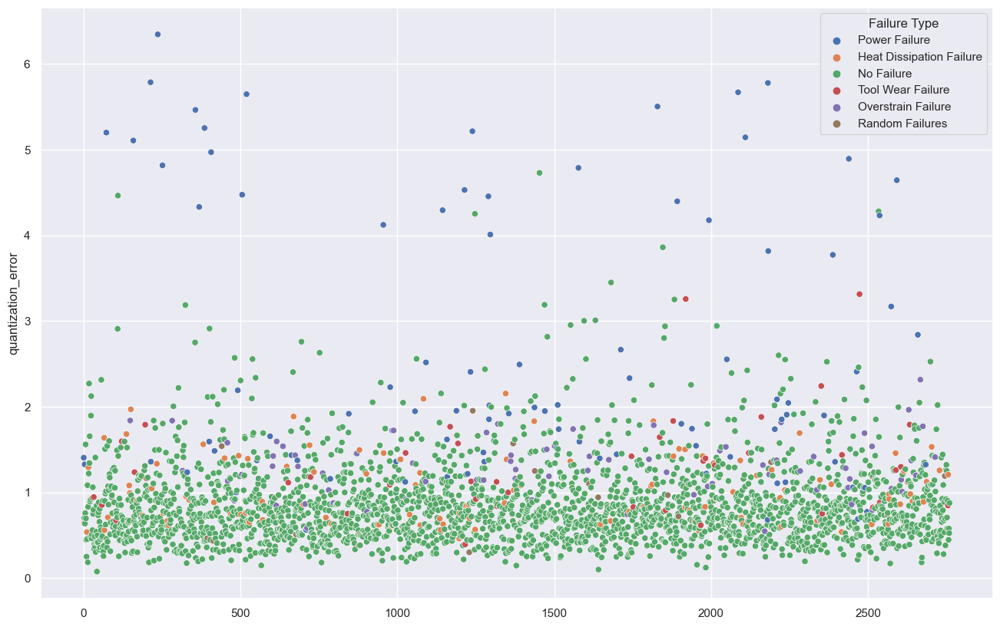

In [57]:
som = MiniSom(math.floor(math.sqrt(numNodes)), math.floor(math.sqrt(numNodes)),5,sigma=7.0,learning_rate=5,neighborhood_function='gaussian')
#print(som.init_weights)
som.train_random(df_stand_normal_train[columnsToTrain].values,10000)

#print(df_stand_test)
quantErr = []
for index,observation in enumerate(df_stand_test[columnsToTrain].values):
    #print(observation)
    quantErr.append(som.quantization_error([observation]))
df_stand_test["quantization_error"] = quantErr


plt.figure(figsize=(16, 10))
sb.scatterplot(data=df_stand_test.sample(frac=1),x=df_stand_test.index,y='quantization_error',hue='Failure Type')

The figure clearly shows that a large portion of the outliers in the quantization error are indeed error types. Notably, the Power Failure is particularly easy to identify. However, some normal data points also appear among the outliers. These are just a few false positives, which are manageable. The bigger issue, though, is that some errors cannot be identified through the quantization error and blend into the normal data. Based on the given features, these datasets resemble the normal behavior of the system, making them difficult to predict without additional information.

In [66]:
quantErrTrain = []
for index,observation in enumerate(df_stand_normal_train[columnsToTrain].values):
    #print(observation)
    quantErrTrain.append(som.quantization_error([observation]))
maxQuantErrorTrain =  max(quantErrTrain)
print(maxQuantErrorTrain)

5.878448077655622


The maximum quantization error for the training data is at the previously shown value. This value is only slightly smaller than the maximum of the test data. Therefore, it cannot be used as a threshold for predicting anomalies. When selecting the threshold, many more false positive anomaly detections must be accepted. This means that among the data points predicted as anomalies, there are also numerous points that correspond to normal behavior (i.e., no failure). 

To reduce the threshold, the parameter $\tau$ is decreased. In the following, the threshold will be used as a predictor for forecasting a failure (failure or no failure).

In [67]:
tauSOM = 0.2
thresholdSOM = maxQuantErrorTrain * tauSOM

pred_SOM_threshold = []
test_SOM_threshold = []
for index,observation in enumerate(df_stand_test[columnsToTrain].values):
    if som.quantization_error([observation]) >= thresholdSOM:
        pred_SOM_threshold.append("Failure")
    else:
        pred_SOM_threshold.append("No Failure")
    if df_stand_test["Failure Type"].iloc[index] == "No Failure":
        test_SOM_threshold.append("No Failure")
    else:
        test_SOM_threshold.append("Failure")
#print(pred_SOM_threshold)
#print(test_SOM_threshold)


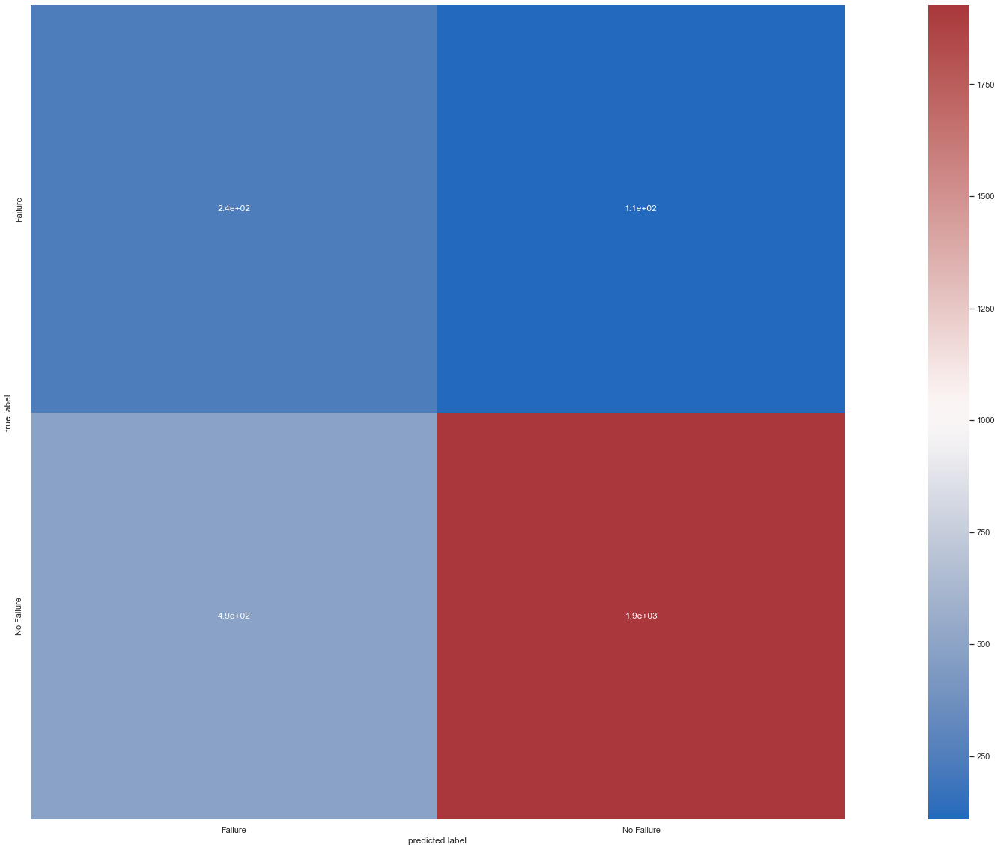

In [68]:
sortedLabels = sorted(set(test_SOM_threshold))
ax = plt.figure(figsize=(10,10))
ax = sb.heatmap(confusion_matrix(test_SOM_threshold,pred_SOM_threshold),square=True,annot=True,cmap="vlag",xticklabels=sortedLabels, yticklabels=sortedLabels)
ax.set(xlabel='predicted label', ylabel='true label')
plt.show()

The shown figure visualizes the trade-off involved in choosing the $\tau$ parameter. When the parameter is lowered, false negatives decrease, but false positives increase significantly. On the other hand, increasing the $\tau$ parameter results in fewer data points being incorrectly classified as failures, but many anomalies then go undetected.

### 4.3.3 SOM Preditictive Maintenance

Similar to the previously trained SOM, a new SOM is trained on the normal behavior data of the system. Subsequently, test data consisting of both normal and error data are generated. However, this time the datasets are not randomly sampled, but are separated in such a way that the quantization error can be calculated for temporally related data points. This allows the quantization error to be used as a condition indicator, enabling the analysis of the progression leading up to a failure.

Errors such as power or overload failures are acknowledged, and the measurement continues. In the case of a tool wear failure, a new tool is used, and the tool usage time is reset. The challenge lies in distinguishing the normal behavior from the error behavior within the dataset. Therefore, initially, only data from the first half of the tool's usage life, before the "Tool Wear Failure" occurs, are used.

Note: In some cases, the tool's usage life is reset even without a prior failure. This behavior cannot be interpreted with the available information.

In [69]:
dataPrev = []
lastData = -2000
normalData = []
for index,row in df_stand_normal[columnsToTrain].iterrows():
    if row['Tool wear [min]'] < lastData:
        lastData = -2000
        for index in range(0,len(dataPrev)//2):
            normalData.append(dataPrev[index])
        dataPrev = []
    else:
        lastData = row['Tool wear [min]']
        dataPrev.append(row.values)
    
len(normalData)
df_normal_data_1half = pd.DataFrame(normalData, columns=columnsToTrain)
df_normal_data_1half


,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min]
0,-0.952389,-0.947360,0.068185,0.282200,-1.695984
1,-0.902393,-0.879959,-0.729472,0.633308,-1.648852
2,-0.952389,-1.014761,-0.227450,0.944290,-1.617430
3,-0.902393,-0.947360,-0.590021,-0.048845,-1.586009
4,-0.902393,-0.879959,-0.729472,0.001313,-1.554588
...,...,...,...,...,...
4724,-0.852397,-1.351765,1.267459,-1.403120,-0.187758
4725,-0.852397,-1.419166,-0.779674,0.783783,-0.140626
4726,-0.852397,-1.351765,0.218792,-0.219383,-0.109205
4727,-0.852397,-1.419166,-0.205138,0.201946,-0.077784


<AxesSubplot:ylabel='quantization_error'>

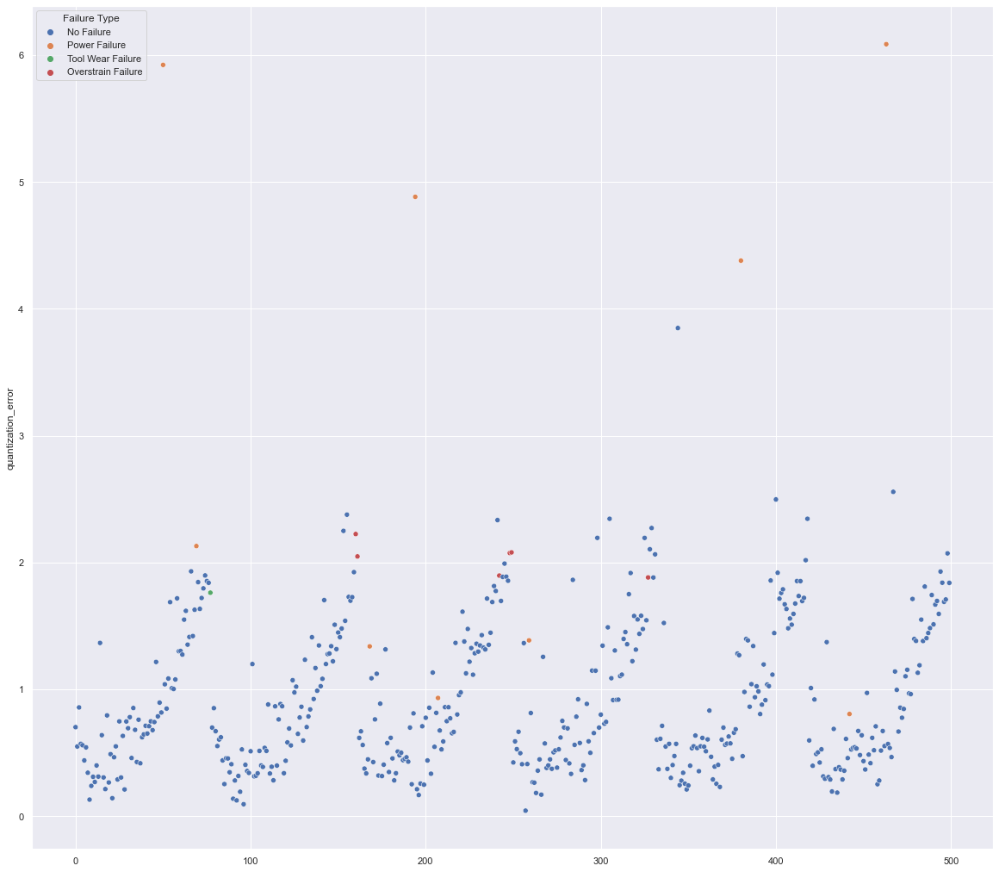

In [70]:

som = MiniSom(math.floor(math.sqrt(numNodes)), math.floor(math.sqrt(numNodes)),5,sigma=7.0,learning_rate=5,neighborhood_function='gaussian')
#print(som.init_weights)
som.train_random(df_normal_data_1half.values,10000)

quantErr = []
for index,observation in enumerate(df_stand2[columnsToTrain].values):
    #print(observation)
    quantErr.append(som.quantization_error([observation]))
df_stand2["quantization_error"] = quantErr


plt.figure(figsize=(16, 15))
sb.scatterplot(data=df_stand2[:500],x=df_stand2[:500].index,y='quantization_error',hue='Failure Type')

The figure clearly illustrates a significant increase. Therefore, the quantization error serves as a good condition indicator. However, the normal data is defined by the tool wear. Tool wear, in turn, is part of the SOM weights. Hence, it is not surprising that the quantization error increases proportionally with the index. The SOM is not familiar with values of tool wear at these levels. On the other hand, it can be argued that the tool wear error is seemingly well predicted by the tool wear itself. All tools fail after a similar usage time. 

In the following, a SOM will be trained without the "Tool wear" feature.

<AxesSubplot:ylabel='quantization_error'>

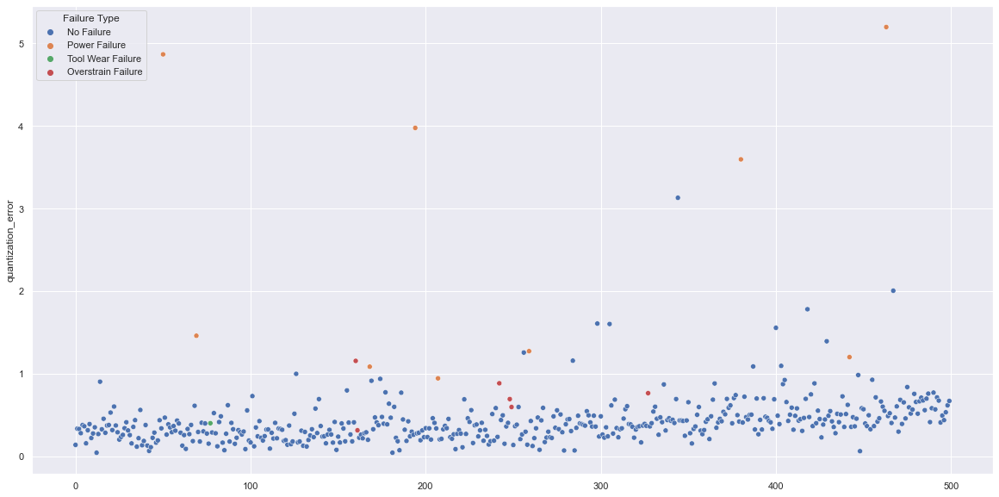

In [71]:
columnsToTrain2 = [i for i in columnsToTrain if i != 'Tool wear [min]']
som = MiniSom(math.floor(math.sqrt(numNodes)), math.floor(math.sqrt(numNodes)),4,sigma=7.0,learning_rate=5,neighborhood_function='gaussian')
#print(som.init_weights)
som.train_random(df_normal_data_1half[columnsToTrain2].values,10000)

quantErr = []
for index,observation in enumerate(df_stand2[columnsToTrain2].values):
    #print(observation)
    quantErr.append(som.quantization_error([observation]))
df_stand2["quantization_error"] = quantErr


plt.figure(figsize=(20, 10))
sb.scatterplot(data=df_stand2[:500],x=df_stand2[:500].index,y='quantization_error',hue='Failure Type')

The figure shows that the quantization error is no longer as suitable as a condition indicator. There is no longer a noticeable difference between data points recorded at the beginning or just before a tool wear failure.

### 4.3.4 PCA

Principal Component Analysis (PCA) is used to reduce data in a way that minimizes the loss of information. In other words, it is a dimensionality reduction technique. It is commonly applied when variables are strongly correlated, as these can be effectively approximated by meaningful linear combinations (principal components), and the variance of the original data is only slightly reduced. The original n variables are reduced to a specified number of virtual variables, known as principal components. This transformation does not provide any direct insights into the values of the principal components themselves. 

In the first step, it is checked whether there are variables that are strongly correlated with each other.

<AxesSubplot:>

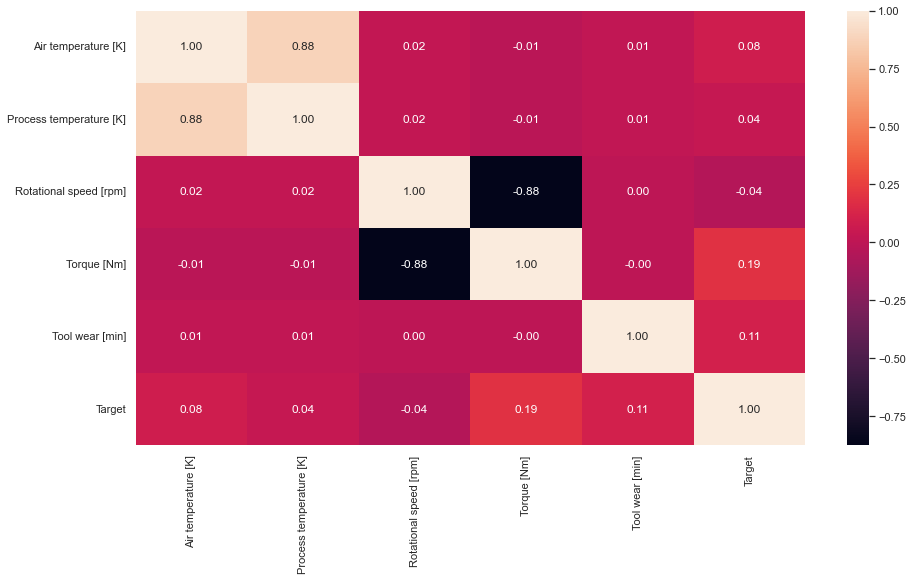

In [72]:
plt.figure(figsize = (15,8))
sb.heatmap(df_stand.corr(),annot=True, fmt="1.2f")

The figure shows that the air and process temperatures, as well as the rotational speed and torque, are strongly correlated with each other (|0.88|). Therefore, a Principal Component Analysis (PCA) is appropriate here, as these variables can likely be well approximated through linear combinations. In the following, a PCA will be performed with three principal components.

In [73]:
from sklearn.decomposition import PCA

Explained Variance: 0.9693735788361623%


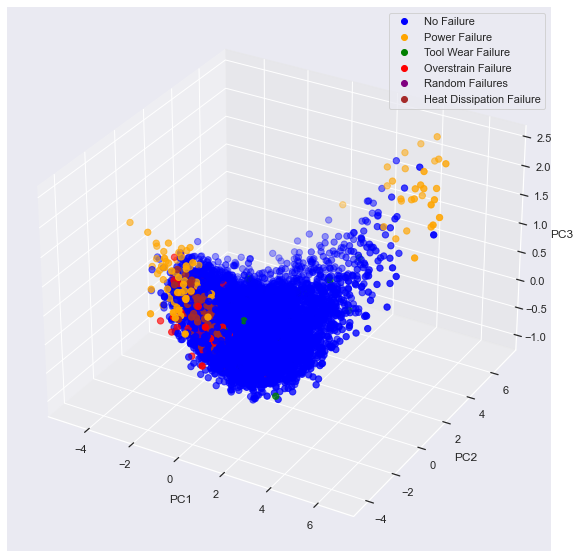

In [74]:
# 3 component pca 
pca3 = PCA(n_components= 3)
components3 = pca3.fit_transform(df_stand.iloc[:,1:5])

df_temp = pd.DataFrame(data = components3, columns = ['PC1','PC2','PC3'])

df_pca3 = pd.concat([df_stand.iloc[:,0:1],df_temp, df_stand.iloc[:,5:8]],axis = 1)
print("Explained Variance: " + str(pca3.explained_variance_ratio_.sum()) + "%")

fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(projection='3d')

colors = {'No Failure':'blue', 'Power Failure':'orange', 'Tool Wear Failure':'green', 'Overstrain Failure':'red','Random Failures':'Purple', 'Heat Dissipation Failure':'brown'}
sc = ax.scatter(df_pca3["PC1"], df_pca3["PC2"], df_pca3["PC3"], s=40,c = df_pca3["Failure Type"].map(colors))

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# generates custom fake lines that will be used as legend entries
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in colors.values()]

plt.legend(markers, colors.keys(),numpoints =1)

plt.show()

The figure shows the three principal components on the x-, y-, and z-axes. The error types are represented in different colors. It can be seen that "No Failure" data points cluster in the center, while "Power" and "Overstrain Failure" are located on the outside. A banana-shaped form emerges. The other error types are difficult to distinguish and are hard to separate from the "No Failure" data points.

The Principal Component Analysis (PCA) with three components can represent approximately 97% of the original variance of all features. This is a very good result. Now, an attempt will be made to train a PCA with only two components in order to reduce the data by one more dimension.

Explained Variance: 0.9377910138005872%


<AxesSubplot:xlabel='PC1', ylabel='PC2'>

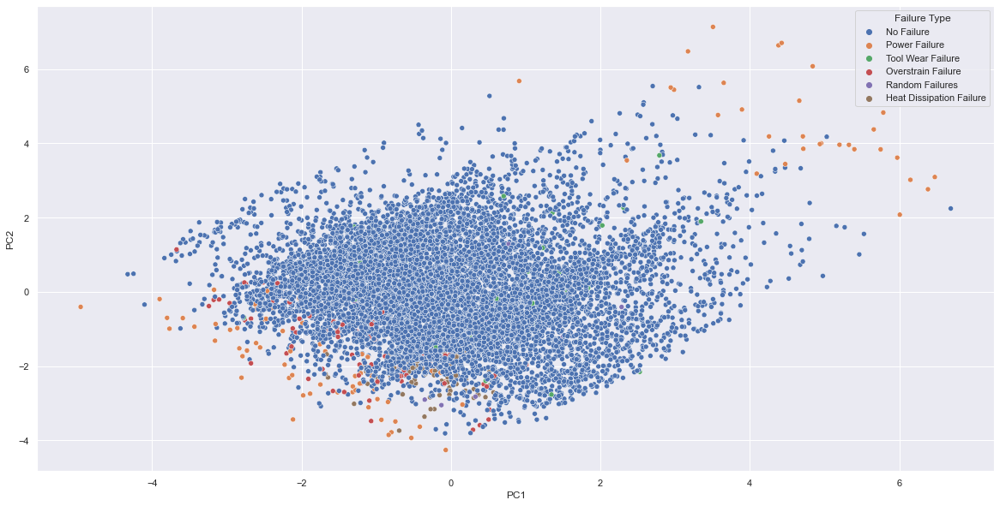

In [75]:
pca = PCA(2) # 2 Components
components = pca.fit_transform(df_stand.iloc[:,1:5])

df_temp = pd.DataFrame(data = components, columns = ['PC1','PC2'])

df_pca = pd.concat([df_stand.iloc[:,0:1],df_temp, df_stand.iloc[:,5:8]],axis = 1)
print("Explained Variance: " + str(pca.explained_variance_ratio_.sum()) + "%")

df_pca["Tool wear [min]"] = df["Tool wear [min]"]
plt.figure(figsize=(20,10))
sb.scatterplot(data=df_pca, y="PC2", x="PC1", hue="Failure Type")

On the x- and y-axes, the two principal components are displayed. The error types are represented in different colors. In the center of the figure, many "No Failure" data points are visible in blue. They are arranged in a trapezoid-like shape, with "Power" and "Overstrain Failure" seen above and below. However, many "Tool Wear Failure" points are also in the center, and they are not easily distinguishable from the "No Failure" points in these two dimensions. 

Since the variance is about 94%, which is only slightly smaller than the PCA with three principal components, it is still possible to add "Tool Wear" as a third dimension and still represent the original variance of all features well. In the following, "Tool Wear" will be added to the plot along one axis, which may allow for better separation of the "Tool Wear Failure" points.

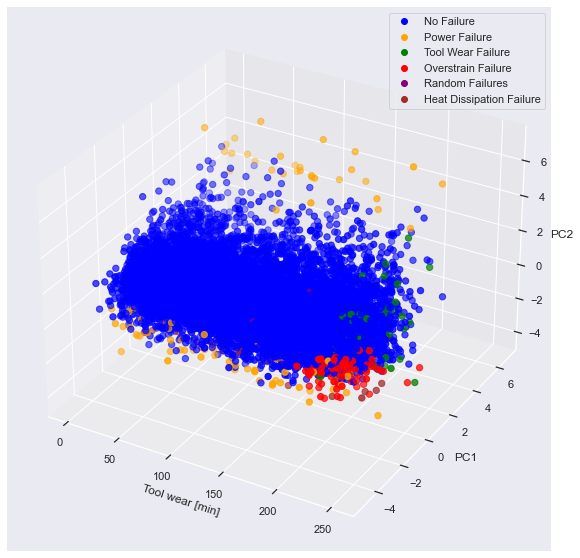

In [76]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(projection='3d')

colors = {'No Failure':'blue', 'Power Failure':'orange', 'Tool Wear Failure':'green', 'Overstrain Failure':'red','Random Failures':'Purple', 'Heat Dissipation Failure':'brown'}
sc = ax.scatter(xs=df_pca["Tool wear [min]"],ys=df_pca["PC1"], zs=df_pca["PC2"],  s=40,c = df_pca["Failure Type"].map(colors))

ax.set_ylabel('PC1')
ax.set_zlabel('PC2')
ax.set_xlabel('Tool wear [min]')

# generates custom fake lines that will be used as legend entries
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in colors.values()]

plt.legend(markers, colors.keys(),numpoints =1)

plt.show()

On the x-axis, "Tool Wear" in minutes is now displayed, with the two principal components shown on the y- and z-axes. The error types are again represented in different colors. This style of representation will be used in all subsequent figures unless described otherwise.

In the center of the figure, there is still a cloud of points that consists almost entirely of "No Failure" data points. Above and below, similar to the two-dimensional representation, "Power Failure" is clearly distinguishable. The addition of "Tool Wear" on the x-axis has helped to better separate "Overstrain" and "Tool Wear Failure" from the normal behavior. It is clearly visible that "Overstrain" and "Tool Wear Failure" are located where "Tool Wear" is high.

### 4.3.5 PCA Preditictive Maintenance

Now, an attempt is made to use PCA for predictive maintenance. The progression of the data points leading up to a "Tool Wear Failure" (after which the tool is replaced) is represented by lines within the PCA space. A potential trend may be observed, where the data points that precede a failure slowly approach the failure points in the PCA space over time. If this is the case, a warning can be issued in advance and/or the machine can be stopped before the failure occurs.

In [77]:
# data until 1st failure happens
df_failure = df_pca.iloc[0:51]
# 2nd failure
df_failure2 = df_pca.iloc[50:70]
# 3rd failure
df_failure3 = df_pca.iloc[69:78]
df_failure3.tail()

,Type,PC1,PC2,Tool wear [min],Target,Failure Type
73,L,-0.165737,0.954144,200,0,No Failure
74,L,-0.066080,1.174630,202,0,No Failure
75,L,-1.455581,-0.119589,204,0,No Failure
76,L,-1.287264,0.049073,206,0,No Failure
77,L,-0.976841,0.367285,208,1,Tool Wear Failure


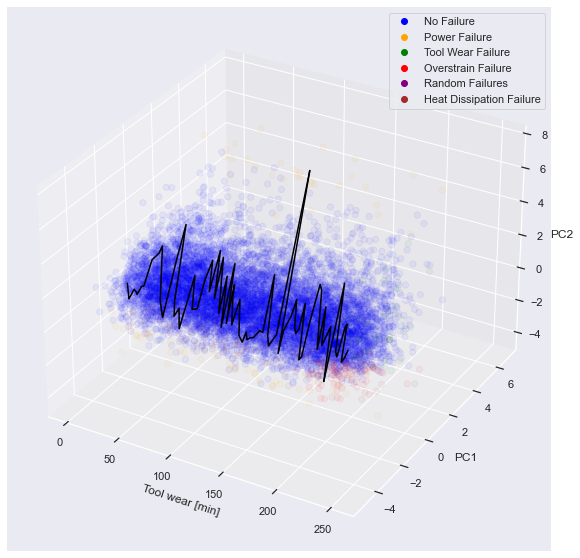

In [85]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(projection='3d')

colors = {'No Failure':'blue', 'Power Failure':'orange', 'Tool Wear Failure':'green', 'Overstrain Failure':'red','Random Failures':'Purple', 'Heat Dissipation Failure':'brown'}
sc = ax.scatter(xs=df_pca["Tool wear [min]"],ys=df_pca["PC1"], zs=df_pca["PC2"],  s=40,c = df_pca["Failure Type"].map(colors),alpha = 0.05)
# lines between the points until first failure
plt.plot(xs=df_failure["Tool wear [min]"],ys=df_failure["PC1"], zs=df_failure["PC2"], color = "black")
# lines between the points until second failure
plt.plot(xs=df_failure2["Tool wear [min]"],ys=df_failure2["PC1"], zs=df_failure2["PC2"], color = "black")
# lines between the points until thrid failure
plt.plot(xs=df_failure3["Tool wear [min]"],ys=df_failure3["PC1"], zs=df_failure3["PC2"], color = "black")

ax.set_ylabel('PC1')
ax.set_zlabel('PC2')
ax.set_xlabel('Tool wear [min]')

# generates custom fake lines that will be used as legend entries
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in colors.values()]

plt.legend(markers, colors.keys(),numpoints =1)

plt.show()

In the figure, it can be seen that the data points in the PCA space are very erratic. The data points leading up to the first failure are marked with a black line. They are all located in the center of the "No Failure" point cloud but jump around quite a bit. After this, a data point drastically deviates from the point cloud due to a "Power Failure". However, no trend or approach of the preceding data points toward this failure point can be observed. The data points leading up to the next "Power Failure" are again within the "No Failure" point cloud, shown in red. Even for the next "Power Failure", which doesn't deviate as much as the first one, no trend in that direction is detectable. The same can be said for the last "Tool Wear Failure." All data points leading up to this failure lie within the "No Failure" point cloud.

Currently, the Principal Component Analysis (PCA) is trained on all the data (both normal and failure data). For predictive maintenance, this is not very effective, similar to the results obtained with the Self-Organizing Map (SOM) and previous findings. In order to use the combination of the two principal components more effectively as a "condition indicator" and detect a trend toward a failure, the machine’s fault behavior will now be excluded from the training process. Therefore, the PCA will be trained only on the normal data ("No Failure"), and all other data points (all failure types) will be transformed into the PCA space. The decision is made to continue using two principal components.

In [79]:
df_stand["Tool wear [min]"] = df["Tool wear [min]"]
df_stand_normal = (df_stand[df_stand['Target']== 0]).reset_index(drop=True)
df_stand_error = (df_stand[df_stand['Target']==1]).reset_index(drop=True)

In [80]:
pca = PCA(2) # 2 Components
pca.fit(df_stand_normal.iloc[:,1:5])

components_normal = pca.transform(df_stand_normal.iloc[:,1:5])
df_temp = pd.DataFrame(data = components_normal, columns = ['PC1','PC2'])
df_pca_normal = pd.concat([df_stand_normal.iloc[:,0:1],df_temp, df_stand_normal.iloc[:,5:8]],axis = 1)


components_error = pca.transform(df_stand_error.iloc[:,1:5])
df_temp = pd.DataFrame(data = components_error, columns = ['PC1','PC2'])
df_pca_error = pd.concat([df_stand_error.iloc[:,0:1],df_temp, df_stand_error.iloc[:,5:8]],axis = 1)

print("Explained Variance: " + str(pca.explained_variance_ratio_.sum()) + "%")
df_pca_error

Explained Variance: 0.9415143456598154%


,Type,PC1,PC2,Tool wear [min],Target,Failure Type
0,L,1.304648,7.596970,143,1,Power Failure
1,L,-1.461101,-2.057099,191,1,Power Failure
2,L,-1.025522,-0.181304,208,1,Tool Wear Failure
3,L,-2.039638,-2.040223,216,1,Overstrain Failure
4,L,-1.819854,-0.949594,218,1,Overstrain Failure
...,...,...,...,...,...,...
334,L,0.672484,4.515232,218,1,Tool Wear Failure
335,L,-1.510045,-2.591047,12,1,Power Failure
336,L,-1.374441,-1.929538,187,1,Overstrain Failure
337,L,-1.420941,-1.652784,206,1,Overstrain Failure


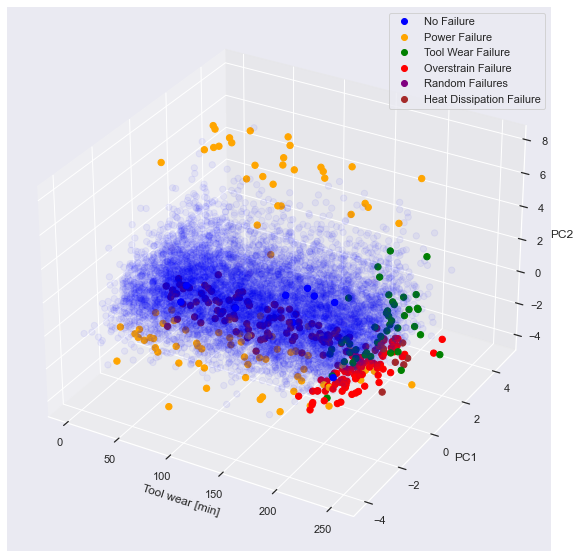

In [81]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(projection='3d')

colors = {'No Failure':'blue', 'Power Failure':'orange', 'Tool Wear Failure':'green', 'Overstrain Failure':'red','Random Failures':'Purple', 'Heat Dissipation Failure':'brown'}
sc = ax.scatter(xs=df_pca_normal["Tool wear [min]"],ys=df_pca_normal["PC1"], zs=df_pca_normal["PC2"],  s=40,c = df_pca_normal["Failure Type"].map(colors),alpha = 0.05)
ax.scatter(xs=df_pca_error["Tool wear [min]"],ys=df_pca_error["PC1"], zs=df_pca_error["PC2"],  s=40,c = df_pca_error["Failure Type"].map(colors),alpha = 1)

ax.set_ylabel('PC1')
ax.set_zlabel('PC2')
ax.set_xlabel('Tool wear [min]')

# generates custom fake lines that will be used as legend entries
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in colors.values()]

plt.legend(markers, colors.keys(),numpoints =1)

plt.show()

In this figure, it can be seen that the different error types are better separated from the normal behavior of the machine, as they now exhibit more significant deviations compared to the figure where the Principal Component Analysis (PCA) was trained on all the data.

For example, the "Power Failures" now have a significantly greater distance from the "No Failure" point cloud than before. Similarly, "Tool Wear Failures" are more clearly distinguishable.

To again illustrate the temporal progression, the data points leading up to the first "Tool Wear Failure" are taken, and an attempt is made to observe whether a trend toward the failures can be detected.

In [82]:
# first n rows until failure occurred, um zeitliche Entwicklung darzustellen
components_all = pca.transform(df_stand.iloc[:,1:5])
df_temp = pd.DataFrame(data = components_all, columns = ['PC1','PC2'])
df_pca_all = pd.concat([df_stand.iloc[:,0:1],df_temp, df_stand.iloc[:,5:8]],axis = 1)


df_failure=df_pca_all.iloc[:df_pca_all.loc[~df_pca_all["Failure Type"].str.contains('No Failure',na=False)].index[0]]
# add row with failure
df_failure = pd.concat([df_failure,df_pca_all.iloc[[50]]],axis=0)


df_failure2 = df_pca_all.iloc[50:70]

df_failure3 = df_pca_all.iloc[69:78]
df_failure3.tail()

,Type,PC1,PC2,Tool wear [min],Target,Failure Type
73,L,-0.598662,0.723040,200,0,No Failure
74,L,-0.617270,0.965754,202,0,No Failure
75,L,-1.210122,-0.839495,204,0,No Failure
76,L,-1.145566,-0.614341,206,0,No Failure
77,L,-1.025522,-0.181304,208,1,Tool Wear Failure


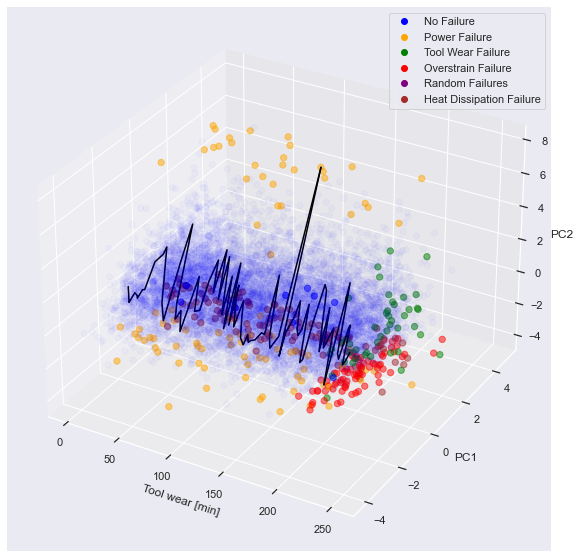

In [83]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(projection='3d')

colors = {'No Failure':'blue', 'Power Failure':'orange', 'Tool Wear Failure':'green', 'Overstrain Failure':'red','Random Failures':'Purple', 'Heat Dissipation Failure':'brown'}
sc = ax.scatter(xs=df_pca_normal["Tool wear [min]"],ys=df_pca_normal["PC1"], zs=df_pca_normal["PC2"],  s=40,c = df_pca_normal["Failure Type"].map(colors),alpha = 0.025)
ax.scatter(xs=df_pca_error["Tool wear [min]"],ys=df_pca_error["PC1"], zs=df_pca_error["PC2"],  s=40,c = df_pca_error["Failure Type"].map(colors),alpha = 0.5)
# lines between the points until first failure
plt.plot(xs=df_failure["Tool wear [min]"],ys=df_failure["PC1"], zs=df_failure["PC2"], color = "black")
# lines between the points until second failure
plt.plot(xs=df_failure2["Tool wear [min]"],ys=df_failure2["PC1"], zs=df_failure2["PC2"], color = "black")
# lines between the points until thrid failure
plt.plot(xs=df_failure3["Tool wear [min]"],ys=df_failure3["PC1"], zs=df_failure3["PC2"], color = "black")

ax.set_ylabel('PC1')
ax.set_zlabel('PC2')
ax.set_xlabel('Tool wear [min]')

# generates custom fake lines that will be used as legend entries
markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in colors.values()]

plt.legend(markers, colors.keys(),numpoints =1)

plt.show()

In this figure, it can be observed that the data points preceding a failure fluctuate significantly, but they all remain within the "No Failure" point cloud. When a failure occurs, no trend toward the failure is visible, and the value deviates (moderately) sharply. This behavior is very similar to the PCA that was trained on all data. It can therefore be concluded that predictive maintenance using Principal Component Analysis (PCA) is not feasible.

The PCA was also performed on the oversampled data using SMOTE. However, the results did not improve, and this approach was ultimately discarded.

# 5. Evaluation

In general, the dataset has too low a density of errors. This limited information content cannot be fully compensated for by data preprocessing or other techniques. Nevertheless, some machine learning models deliver satisfactory results. For instance, a neural network designed to predict error types achieves an F1-score of 0.90. Since the best possible F1-score is 1, this is considered a satisfactory result. 

The prediction of "Tool Wear" by a neural network already suggests that implementing predictive maintenance will be challenging. The Self-Organizing Map (SOM) shows that error types cluster but cannot be clearly separated from "No Failure" data points. The PCA also indicates that error types can be distinguished from "No Failure" data points. However, the sampling rate of the data points, with a minimum of two minutes, is too low to detect a clear trend in the condition indicator toward a failure.

Despite the possibility of false positives, predictive maintenance using SOMs or neural networks is still feasible. Neural networks, in particular, can also provide a good Remaining Useful Life (RUL) prediction. However, the dataset is too small to generalize the predictive power of the models for practical applications.